In [1]:
import numpy as np
import pandas as pd

import random
import ijson
import json

In [2]:
filepath = 'data_arXiv/arxiv-metadata-oai-snapshot.json'

In [3]:
with open(filepath, 'r') as f:
    for i, line in enumerate(f):
        obj = json.loads(line.strip())  # Convertir línea JSON a diccionario
        print(obj)
        if i == 4:
            break

{'id': '0704.0001', 'submitter': 'Pavel Nadolsky', 'authors': "C. Bal\\'azs, E. L. Berger, P. M. Nadolsky, C.-P. Yuan", 'title': 'Calculation of prompt diphoton production cross sections at Tevatron and\n  LHC energies', 'comments': '37 pages, 15 figures; published version', 'journal-ref': 'Phys.Rev.D76:013009,2007', 'doi': '10.1103/PhysRevD.76.013009', 'report-no': 'ANL-HEP-PR-07-12', 'categories': 'hep-ph', 'license': None, 'abstract': '  A fully differential calculation in perturbative quantum chromodynamics is\npresented for the production of massive photon pairs at hadron colliders. All\nnext-to-leading order perturbative contributions from quark-antiquark,\ngluon-(anti)quark, and gluon-gluon subprocesses are included, as well as\nall-orders resummation of initial-state gluon radiation valid at\nnext-to-next-to-leading logarithmic accuracy. The region of phase space is\nspecified in which the calculation is most reliable. Good agreement is\ndemonstrated with data from the Fermilab

#### NOTA IMPORTANTE:

He intentado cargar el dataset entero pero es demasiado grande. 

He tenido que parar el kernel a los 15 minutos, ya que todavía no había terminado de cargar.

_Por eso comentamos la siguiente linea:_ 

In [4]:
## df = pd.read_json(filepath, lines=True)

### Cargar una Muestra Representativa

Como el dataset es muy grande 4.52GB procedemos a crear una muestra representativa de ella

In [5]:
# Cargamos una Muestra Representativa

sample_size = 0.01  # 1% de la muestra
sample_records = []
total = 0

with open(filepath, 'r') as f:
    for line in f:
        total += 1
        # Aplicamos el muestreo aleatorio
        if random.random() < sample_size:
            try:
                obj = json.loads(line.strip())
                sample_records.append(obj)
            except json.JSONDecodeError as e:
                print("Error al decodificar:", e)

print(f"Total de registros procesados: {total}")
print(f"Total de registros en la muestra: {len(sample_records)}")


Total de registros procesados: 2661459
Total de registros en la muestra: 26811


In [6]:
sample_records[0]

{'id': '0704.0080',
 'submitter': 'Dean McLaughlin',
 'authors': 'Dean E. McLaughlin and S. Michael Fall',
 'title': 'Shaping the Globular Cluster Mass Function by Stellar-Dynamical\n  Evaporation',
 'comments': 'Final version, matching the published paper',
 'journal-ref': 'Astrophys.J.679:1272-1287,2008',
 'doi': '10.1086/533485',
 'report-no': None,
 'categories': 'astro-ph',
 'license': 'http://arxiv.org/licenses/nonexclusive-distrib/1.0/',
 'abstract': "  We show that the globular cluster mass function (GCMF) in the Milky Way\ndepends on cluster half-mass density (rho_h) in the sense that the turnover\nmass M_TO increases with rho_h while the width of the GCMF decreases. We argue\nthat this is the expected signature of the slow erosion of a mass function that\ninitially rose towards low masses, predominantly through cluster evaporation\ndriven by internal two-body relaxation. We find excellent agreement between the\nobserved GCMF -- including its dependence on internal density rho

#### Guardamos la muestra

In [7]:
# Guardar la muestra
with open('data_arXiv/arxiv_sample.json', 'w') as out_file:
    json.dump(sample_records, out_file, indent=2)


In [8]:
df = pd.DataFrame(sample_records)

In [9]:
print(f"Sahpe: {df.shape}")
print(f"Size: {df.size}\n")
print(f"Columns: {df.columns}\n")
df.info()

Sahpe: (26811, 14)
Size: 375354

Columns: Index(['id', 'submitter', 'authors', 'title', 'comments', 'journal-ref', 'doi',
       'report-no', 'categories', 'license', 'abstract', 'versions',
       'update_date', 'authors_parsed'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26811 entries, 0 to 26810
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              26811 non-null  object
 1   submitter       26656 non-null  object
 2   authors         26811 non-null  object
 3   title           26811 non-null  object
 4   comments        19846 non-null  object
 5   journal-ref     8936 non-null   object
 6   doi             12419 non-null  object
 7   report-no       1834 non-null   object
 8   categories      26811 non-null  object
 9   license         22241 non-null  object
 10  abstract        26811 non-null  object
 11  versions        26811 non-null  object
 12  update_date    

In [10]:
# # Estadísticas básicas
# print(df.describe())

In [11]:
# Conteo por categoría (
if 'categories' in df.columns:
    print(df['categories'].value_counts())

categories
astro-ph                                 883
hep-ph                                   792
quant-ph                                 697
cs.CV                                    676
hep-th                                   603
                                        ... 
stat.ML cs.AI cs.LG q-bio.GN q-bio.TO      1
physics.med-ph stat.AP                     1
math.FA math.AP math.SP                    1
cs.LG cs.AI cs.CR stat.ML                  1
supr-con cond-mat.supr-con                 1
Name: count, Length: 4563, dtype: int64


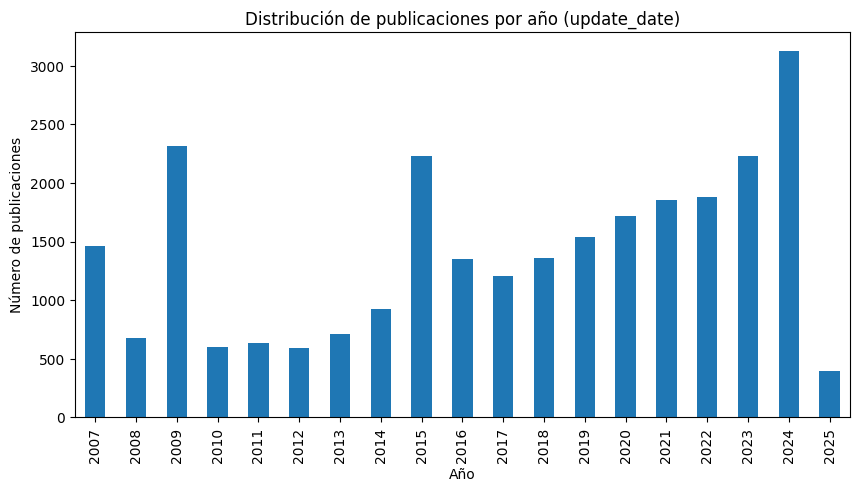

In [12]:
import matplotlib.pyplot as plt

# Convertimo la columna 'update_date' a datetime
df['update_date'] = pd.to_datetime(df['update_date'], errors='coerce')
df['year'] = df['update_date'].dt.year

# Nos aseguramos de que existen años válidos
if df['year'].notnull().sum() > 0:
    df['year'].value_counts().sort_index().plot(kind='bar', figsize=(10, 5))
    plt.title("Distribución de publicaciones por año (update_date)")
    plt.xlabel("Año")
    plt.ylabel("Número de publicaciones")
    plt.show()
else:
    print("No se encontraron fechas válidas en la columna 'update_date'.")


#### Contamos la frecuencia de categorías y mostramos las top 10

Top 10 categorías:
categories
astro-ph             883
hep-ph               792
quant-ph             697
cs.CV                676
hep-th               603
cond-mat.mtrl-sci    435
math.AP              384
cond-mat.mes-hall    356
astro-ph.GA          335
gr-qc                319
Name: count, dtype: int64


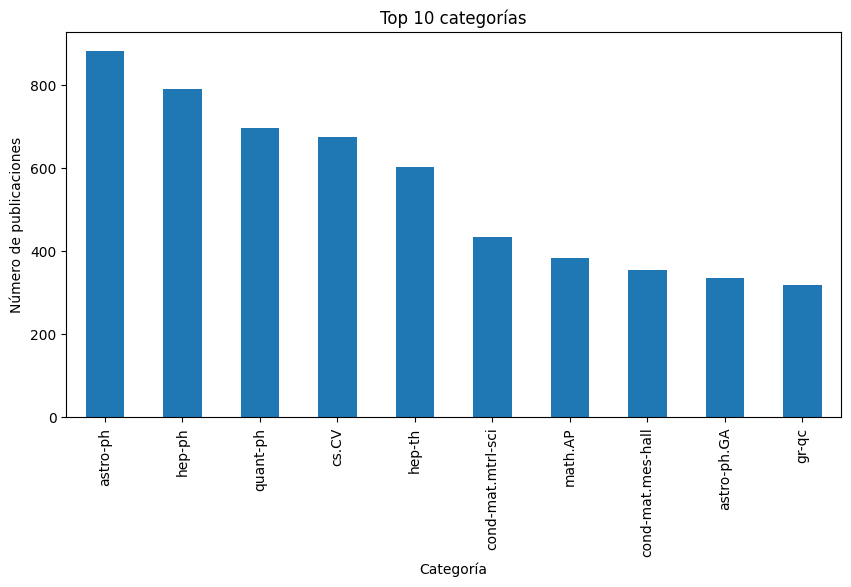

In [13]:
# Contamos la frecuencia de categorías y mostramos las top 10
cat_counts = df['categories'].value_counts()
print("Top 10 categorías:")
print(cat_counts.head(10))
cat_counts.head(10).plot(kind='bar', figsize=(10, 5))
plt.title("Top 10 categorías")
plt.xlabel("Categoría")
plt.ylabel("Número de publicaciones")
plt.show()

#### Extraemos los autores de la columna 'authors_parsed' y contamos los más frecuentes


NOTA: 32m 11.1s 

Top 10 autores:
[Zhang, Y., ]                36
[Wang, Y., ]                 27
[ATLAS Collaboration, , ]    24
[Liu, Yang, ]                23
[Li, Y., ]                   22
[Wang, Z., ]                 19
[Li, C., ]                   19
[Liu, Y., ]                  19
[Liu, X., ]                  18
[Zhang, J., ]                17
Name: count, dtype: int64


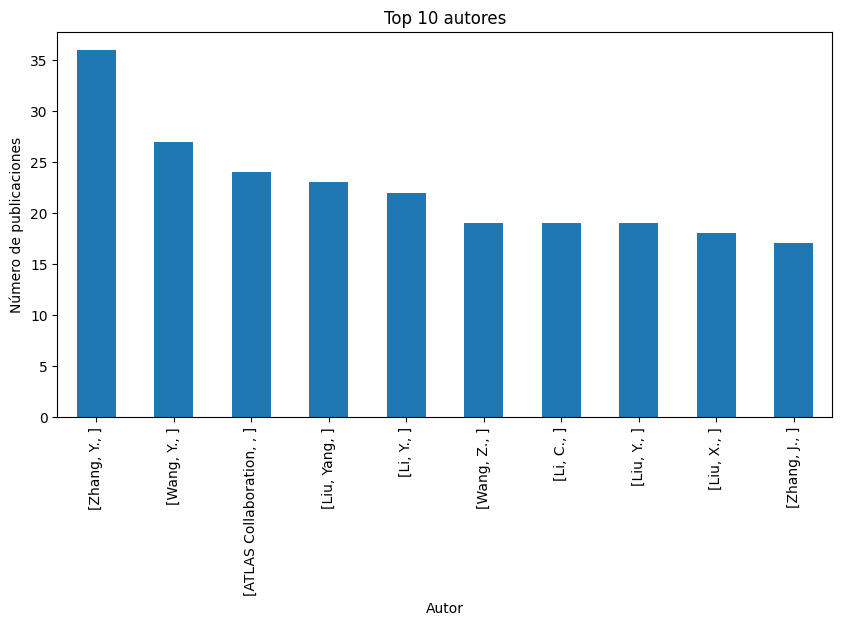

In [ ]:
# authors_list = []
# for auth in df['authors_parsed']:
#     if isinstance(auth, list):
#         authors_list.extend(auth)
# top_authors = pd.Series(authors_list).value_counts()
# print("Top 10 autores:")
# print(top_authors.head(10))
# top_authors.head(10).plot(kind='bar', figsize=(10, 5))
# plt.title("Top 10 autores")
# plt.xlabel("Autor")
# plt.ylabel("Número de publicaciones")
# plt.show()

Dado que esta úlima celda ha tardado 30 minutos en procesar, vamos a prodeceder a reducir drásticamente la cantidad de muestras (papers) con las que vamos a trabajar de ahora en adelante.

---

---

---

Nuevo comienzo

---

---

---

### Generamos una Nueva Muestra Representativa _ _(más reducidad)_


In [14]:
import numpy as np
import pandas as pd

import random
import ijson
import json

import plotly.express as px
import plotly.graph_objects as go

In [15]:
# Cargamos una Muestra Representativa
filepath = 'data_arXiv/arxiv-metadata-oai-snapshot.json'

sample_size = 0.005  # 1% de la muestra
sample_records = []
total = 0

with open(filepath, 'r') as f:
    for line in f:
        total += 1
        # Aplicamos el muestreo aleatorio
        if random.random() < sample_size:
            try:
                obj = json.loads(line.strip())
                sample_records.append(obj)
            except json.JSONDecodeError as e:
                print("Error al decodificar:", e)

print(f"Total de registros procesados: {total}")
print(f"Total de registros en la muestra: {len(sample_records)}")

Total de registros procesados: 2661459
Total de registros en la muestra: 13349


In [16]:
# Guardar la muestra
with open('data_arXiv/arxiv_sample_ULTRA_SMALL.json', 'w') as out_file:
    json.dump(sample_records, out_file, indent=2)


In [17]:
df = pd.DataFrame(sample_records)

In [18]:
df.shape

(13349, 14)

In [19]:
df.head(5)

,id,submitter,authors,title,comments,journal-ref,doi,report-no,categories,license,abstract,versions,update_date,authors_parsed
0,0704.0128,Kim Page,"P.A. Evans (1), A.P. Beardmore (1), K.L. Page ...",An online repository of Swift/XRT light curves...,"8 pages, 6 figures, Accepted for publication i...",None,10.1051/0004-6361:20077530,None,astro-ph,None,Context. Swift data are revolutionising our ...,"[{'version': 'v1', 'created': 'Mon, 2 Apr 2007...",2009-11-13,"[[Evans, P. A., ], [Beardmore, A. P., ], [Page..."
1,0704.0550,Angela Bragaglia,"Monica Tosi (1), Angela Bragaglia (1), Michele...",The old open clusters Berkeley 32 and King 11,Accepted for publication on MNRAS (figs. 6 and...,"Mon.Not.Roy.Astron.Soc.378:730-740,2007",10.1111/j.1365-2966.2007.11827.x,None,astro-ph,None,We have obtained CCD BVI imaging of the old ...,"[{'version': 'v1', 'created': 'Wed, 4 Apr 2007...",2009-06-23,"[[Tosi, Monica, ], [Bragaglia, Angela, ], [Cig..."
2,0704.0613,D. B. Gutman,D. B. Gutman and D. L. Maslov,Anomalous c-axis transport in layered metals,5 pages 2 figures,"Phys. Rev. Lett. 99, 196602 (2007)",10.1103/PhysRevLett.99.196602,None,cond-mat.str-el cond-mat.dis-nn,None,Transport in metals with strongly anisotropi...,"[{'version': 'v1', 'created': 'Wed, 4 Apr 2007...",2009-03-22,"[[Gutman, D. B., ], [Maslov, D. L., ]]"
3,0704.1111,Jacobus Verbaarschot,L. Ravagli and J.J.M. Verbaarschot,QCD in One Dimension at Nonzero Chemical Poten...,"Latex, 23 pages and 5 figures; Added two refer...","Phys.Rev.D76:054506,2007",10.1103/PhysRevD.76.054506,None,hep-th hep-lat,None,Using an integration formula recently derive...,"[{'version': 'v1', 'created': 'Mon, 9 Apr 2007...",2008-11-26,"[[Ravagli, L., ], [Verbaarschot, J. J. M., ]]"
4,0704.1223,Fulvia Confortola,"Philippe Briand, Fulvia Confortola",Quadratic BSDEs with random terminal time and ...,None,"Electron. J. Probab. 13 (2008), 54, 1529-1561",None,None,math.PR,None,In this paper we study one dimensional backw...,"[{'version': 'v1', 'created': 'Tue, 10 Apr 200...",2013-10-21,"[[Briand, Philippe, ], [Confortola, Fulvia, ]]"


In [20]:
df.head(5).T

,0,1,2,3,4
id,0704.0128,0704.0550,0704.0613,0704.1111,0704.1223
submitter,Kim Page,Angela Bragaglia,D. B. Gutman,Jacobus Verbaarschot,Fulvia Confortola
authors,"P.A. Evans (1), A.P. Beardmore (1), K.L. Page ...","Monica Tosi (1), Angela Bragaglia (1), Michele...",D. B. Gutman and D. L. Maslov,L. Ravagli and J.J.M. Verbaarschot,"Philippe Briand, Fulvia Confortola"
title,An online repository of Swift/XRT light curves...,The old open clusters Berkeley 32 and King 11,Anomalous c-axis transport in layered metals,QCD in One Dimension at Nonzero Chemical Poten...,Quadratic BSDEs with random terminal time and ...
comments,"8 pages, 6 figures, Accepted for publication i...",Accepted for publication on MNRAS (figs. 6 and...,5 pages 2 figures,"Latex, 23 pages and 5 figures; Added two refer...",None
journal-ref,None,"Mon.Not.Roy.Astron.Soc.378:730-740,2007","Phys. Rev. Lett. 99, 196602 (2007)","Phys.Rev.D76:054506,2007","Electron. J. Probab. 13 (2008), 54, 1529-1561"
doi,10.1051/0004-6361:20077530,10.1111/j.1365-2966.2007.11827.x,10.1103/PhysRevLett.99.196602,10.1103/PhysRevD.76.054506,None
report-no,None,None,None,None,None
categories,astro-ph,astro-ph,cond-mat.str-el cond-mat.dis-nn,hep-th hep-lat,math.PR
license,None,None,None,None,None


In [21]:
df.shape

(13349, 14)

In [22]:
df.columns

Index(['id', 'submitter', 'authors', 'title', 'comments', 'journal-ref', 'doi',
       'report-no', 'categories', 'license', 'abstract', 'versions',
       'update_date', 'authors_parsed'],
      dtype='object')

## Distribución de publicaciones por año

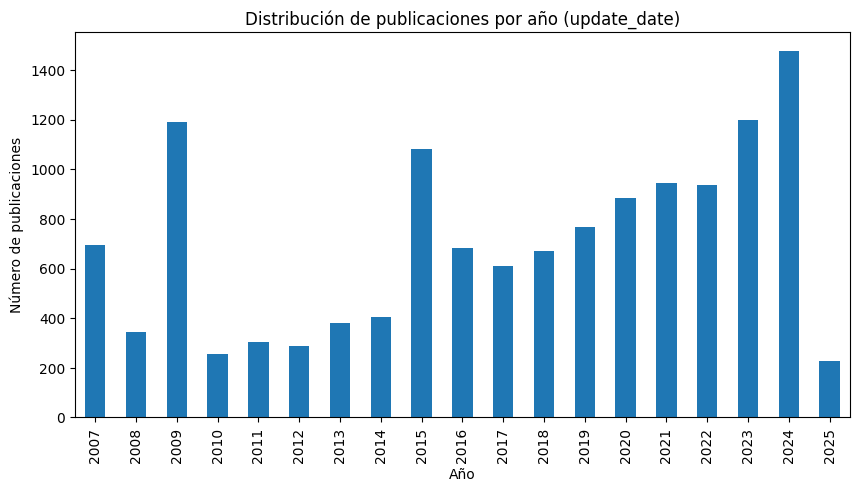

In [23]:
import matplotlib.pyplot as plt

# Convertimo la columna 'update_date' a datetime
df['update_date'] = pd.to_datetime(df['update_date'], errors='coerce')
df['year'] = df['update_date'].dt.year

# Nos aseguramos de que existen años válidos
if df['year'].notnull().sum() > 0:
    df['year'].value_counts().sort_index().plot(kind='bar', figsize=(10, 5))
    plt.title("Distribución de publicaciones por año (update_date)")
    plt.xlabel("Año")
    plt.ylabel("Número de publicaciones")
    plt.show()
else:
    print("No se encontraron fechas válidas en la columna 'update_date'.")


In [78]:
# Convertimos la columna 'update_date' a datetime y extraemos el año
df['update_date'] = pd.to_datetime(df['update_date'], errors='coerce')
df['year'] = df['update_date'].dt.year

# Contamos la cantidad de publicaciones por año
year_counts = df['year'].value_counts().reset_index()
year_counts.columns = ['year', 'count']  # Renombramos columnas

# Distribución de publicaciones por año (update_date)
fig_year = px.bar(
    year_counts.sort_values(by='year'),  # Ordenamos por año
    x='year', y='count',
    labels={'year': 'Año', 'count': 'Número de publicaciones'},
    title="Distribución de publicaciones por año (update_date)"
)
fig_year.show()

## Top 10 de categorías

Top 10 categorías:
categories
astro-ph             452
hep-ph               436
quant-ph             355
cs.CV                323
hep-th               279
cond-mat.mtrl-sci    217
cond-mat.mes-hall    181
math.AP              174
astro-ph.GA          159
astro-ph.SR          151
Name: count, dtype: int64


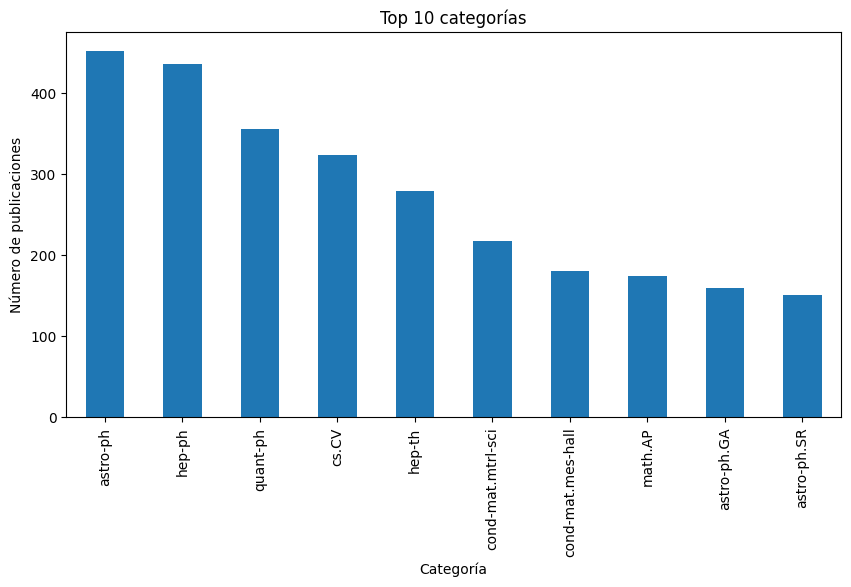

In [24]:
# Contamos la frecuencia de categorías y mostramos las top 10
cat_counts = df['categories'].value_counts()
print("Top 10 categorías:")
print(cat_counts.head(10))
cat_counts.head(10).plot(kind='bar', figsize=(10, 5))
plt.title("Top 10 categorías")
plt.xlabel("Categoría")
plt.ylabel("Número de publicaciones")
plt.show()

In [25]:
# Contamos la frecuencia de categorías y mostramos las top 10
cat_counts = df['categories'].value_counts().reset_index().head(20)
cat_counts.columns = ['categories', 'count']  # Renombramos columnas

# Mostramos los 10 categorías más frecuentes
print("Top 10 categorías reestructurados:")
print(cat_counts.head(20))

# Frecuencia de categorías y top 10 categorías
fig_cat = px.bar(
    cat_counts,
    x='categories', y='count',
    labels={'categories': 'Categoría', 'count': 'Número de publicaciones'},
    title="Top 20 categorías"
)
fig_cat.show()


Top 10 categorías reestructurados:
           categories  count
0            astro-ph    452
1              hep-ph    436
2            quant-ph    355
3               cs.CV    323
4              hep-th    279
5   cond-mat.mtrl-sci    217
6   cond-mat.mes-hall    181
7             math.AP    174
8         astro-ph.GA    159
9         astro-ph.SR    151
10            math.CO    150
11              gr-qc    146
12            math.PR    142
13              cs.CL    135
14    cond-mat.str-el    135
15            math.NT    129
16              cs.LG    128
17        astro-ph.HE    123
18        astro-ph.CO    115
19      cs.IT math.IT    112


---

## Web scraping de la taxonomía categórica de arXiv

Accedemos a la página de arXiv para obtener el cluster, la categoría abreviada, la categoría y la descripción de todas las categorías de los artículos publicados en arXiv.

In [98]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

# URL de la página de categorías de arXiv
url = 'https://arxiv.org/category_taxonomy'

# Realizar la solicitud HTTP
response = requests.get(url)
response.raise_for_status()  # Verificar que la solicitud fue exitosa

# Analizar el contenido HTML
soup = BeautifulSoup(response.text, 'html.parser')

# Encontrar todas las categorías y descripciones
categories = soup.find_all('h4')
descriptions = soup.find_all('p')

# Extraer nombres de categorías y descripciones
data = []
for cat, desc in zip(categories, descriptions):
    category_name = cat.get_text(strip=True)
    description = desc.get_text(strip=True)
    data.append({'Categoría': category_name, 'Descripción': description})

# Crear un DataFrame con los datos
df_arxiv_cat = pd.DataFrame(data)

# Eliminar las primeras dos filas incorrectas
df_arxiv_cat = df_arxiv_cat.iloc[1:].reset_index(drop=True)

# Mover la columna 'Descripción' dos posiciones arriba
df_arxiv_cat['Descripción'] = df_arxiv_cat['Descripción'].shift(-2)

# Eliminar las últimas dos filas que ahora tienen NaN en 'Descripción'
df_arxiv_cat = df_arxiv_cat.dropna().reset_index(drop=True)

# Guardar el DataFrame limpio en un archivo CSV
csv_filename = "arxiv_categorias.csv"
df_arxiv_cat.to_csv(csv_filename, index=False, encoding='utf-8')

print(f"Archivo '{csv_filename}' creado con éxito.")


Archivo 'arxiv_categorias.csv' creado con éxito.


In [99]:
df_arxiv_cat.head(10)

,Categoría,Descripción
0,cs.AI(Artificial Intelligence),"Covers all areas of AI except Vision, Robotics..."
1,cs.AR(Hardware Architecture),Covers systems organization and hardware archi...
2,cs.CC(Computational Complexity),"Covers models of computation, complexity class..."
3,"cs.CE(Computational Engineering, Finance, and ...",Covers applications of computer science to the...
4,cs.CG(Computational Geometry),Roughly includes material in ACM Subject Class...
5,cs.CL(Computation and Language),Covers natural language processing. Roughly in...
6,cs.CR(Cryptography and Security),Covers all areas of cryptography and security ...
7,cs.CV(Computer Vision and Pattern Recognition),"Covers image processing, computer vision, patt..."
8,cs.CY(Computers and Society),"Covers impact of computers on society, compute..."
9,cs.DB(Databases),"Covers database management, datamining, and da..."


In [100]:
df_arxiv_cat.columns

Index(['Categoría', 'Descripción'], dtype='object')

In [101]:
# Crear nuevas columnas separando la información en 'Category_abr' y 'Category'
df_arxiv_cat['Category_abr'] = df_arxiv_cat['Categoría'].str.extract(r'(^[\w.-]+)')
df_arxiv_cat['Category'] = df_arxiv_cat['Categoría'].str.extract(r'\((.*?)\)')

# Renombrar la columna 'Descripción' a 'Description'
df_arxiv_cat = df_arxiv_cat.rename(columns={'Descripción': 'Description'})

# Reordenar columnas y eliminar la columna original 'Categoría'
df_arxiv_cat = df_arxiv_cat[['Category_abr', 'Category', 'Description']]

# Guardar el DataFrame limpio en un archivo CSV
csv_filename = "data_arXiv/arxiv_categorias_final.csv"
df_arxiv_cat.to_csv(csv_filename, index=False, encoding='utf-8')

In [102]:
df_arxiv_cat.head(3)

,Category_abr,Category,Description
0,cs.AI,Artificial Intelligence,"Covers all areas of AI except Vision, Robotics..."
1,cs.AR,Hardware Architecture,Covers systems organization and hardware archi...
2,cs.CC,Computational Complexity,"Covers models of computation, complexity class..."


In [103]:
df_arxiv_cat.columns

Index(['Category_abr', 'Category', 'Description'], dtype='object')

In [104]:
print(f"Category_abr: {df_arxiv_cat['Category_abr'][0]}")
print(f"Category: {df_arxiv_cat['Category'][0]}")
print(f"Description: {df_arxiv_cat['Description'][0]}")
df_arxiv_cat.head(10)


Category_abr: cs.AI
Category: Artificial Intelligence
Description: Covers all areas of AI except Vision, Robotics, Machine Learning, Multiagent Systems, and Computation and Language (Natural Language Processing), which have separate subject areas. In particular, includes Expert Systems, Theorem Proving (although this may overlap with Logic in Computer Science), Knowledge Representation, Planning, and Uncertainty in AI. Roughly includes material in ACM Subject Classes I.2.0, I.2.1, I.2.3, I.2.4, I.2.8, and I.2.11.


,Category_abr,Category,Description
0,cs.AI,Artificial Intelligence,"Covers all areas of AI except Vision, Robotics..."
1,cs.AR,Hardware Architecture,Covers systems organization and hardware archi...
2,cs.CC,Computational Complexity,"Covers models of computation, complexity class..."
3,cs.CE,"Computational Engineering, Finance, and Science",Covers applications of computer science to the...
4,cs.CG,Computational Geometry,Roughly includes material in ACM Subject Class...
5,cs.CL,Computation and Language,Covers natural language processing. Roughly in...
6,cs.CR,Cryptography and Security,Covers all areas of cryptography and security ...
7,cs.CV,Computer Vision and Pattern Recognition,"Covers image processing, computer vision, patt..."
8,cs.CY,Computers and Society,"Covers impact of computers on society, compute..."
9,cs.DB,Databases,"Covers database management, datamining, and da..."


In [105]:
df_arxiv_cat.tail(10)

,Category_abr,Category,Description
143,q-fin.MF,Mathematical Finance,Mathematical and analytical methods of finance...
144,q-fin.PM,Portfolio Management,"Security selection and optimization, capital a..."
145,q-fin.PR,Pricing of Securities,"Valuation and hedging of financial securities,..."
146,q-fin.RM,Risk Management,Measurement and management of financial risks ...
147,q-fin.ST,Statistical Finance,"Statistical, econometric and econophysics anal..."
148,q-fin.TR,Trading and Market Microstructure,"Market microstructure, liquidity, exchange and..."
149,stat.AP,Applications,"Biology, Education, Epidemiology, Engineering,..."
150,stat.CO,Computation,"Algorithms, Simulation, Visualization"
151,stat.ME,Methodology,"Design, Surveys, Model Selection, Multiple Tes..."
152,stat.ML,Machine Learning,"Covers machine learning papers (supervised, un..."


---

In [106]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

# URL de la página de categorías de arXiv
url = 'https://arxiv.org/category_taxonomy'

# Realizar la solicitud HTTP
response = requests.get(url)
response.raise_for_status()  # Verificar que la solicitud fue exitosa

# Analizar el contenido HTML
soup = BeautifulSoup(response.text, 'html.parser')

# Encontrar los clusters principales (h2) y las categorías dentro de cada cluster
clusters = soup.find_all('h2')
categories = soup.find_all('h4')
descriptions = soup.find_all('p')

# Lista para almacenar los datos
data = []
current_cluster = None

# Extraer los clusters y las categorías
for tag in soup.find_all():
    if tag.name == 'h2':  # Si es un título de sección (Cluster)
        current_cluster = tag.get_text(strip=True)
    elif tag.name == 'h4':  # Si es una categoría
        category_name = tag.get_text(strip=True)
        description_tag = tag.find_next_sibling('p')  # Buscar la descripción asociada
        description = description_tag.get_text(strip=True) if description_tag else ""
        data.append({'Cluster': current_cluster, 'Categoría': category_name, 'Descripción': description})

# Crear un DataFrame con los datos
df_arxiv_cat_clusters = pd.DataFrame(data)

# Eliminar la primera fila que contiene los headers de la página
df_arxiv_cat_clusters = df_arxiv_cat_clusters.iloc[1:].reset_index(drop=True)

# Crear nuevas columnas separando la información en 'Category_abr' y 'Category'
df_arxiv_cat_clusters['Category_abr'] = df_arxiv_cat_clusters['Categoría'].str.extract(r'(^[\w.-]+)')
df_arxiv_cat_clusters['Category'] = df_arxiv_cat_clusters['Categoría'].str.extract(r'\((.*?)\)')

# Renombrar la columna 'Descripción' a 'Description'
df_arxiv_cat_clusters = df_arxiv_cat_clusters.rename(columns={'Descripción': 'Description'})

# Reordenar columnas y eliminar la columna original 'Categoría'
df_arxiv_cat_clusters = df_arxiv_cat_clusters[['Cluster', 'Category_abr', 'Category', 'Description']]

# Eliminar la columna 'Description' ya que no hemos conseguido descargarnos las descripciones
df_arxiv_cat_clusters = df_arxiv_cat_clusters.drop(['Description'], axis=1)

# Guardar el DataFrame limpio en un archivo CSV
csv_filename = "data_arXiv/arxiv_categorias_con_clusters.csv"
df_arxiv_cat_clusters.to_csv(csv_filename, index=False, encoding='utf-8')

print(f"Archivo '{csv_filename}' creado con éxito.")


Archivo 'data_arXiv/arxiv_categorias_con_clusters.csv' creado con éxito.


In [107]:
print(f"Description: {df_arxiv_cat_clusters['Cluster'][0]}")
print(f"Category_abr: {df_arxiv_cat_clusters['Category_abr'][0]}")
print(f"Category: {df_arxiv_cat_clusters['Category'][0]}")
df_arxiv_cat_clusters.head(10)


Description: Computer Science
Category_abr: cs.AI
Category: Artificial Intelligence


,Cluster,Category_abr,Category
0,Computer Science,cs.AI,Artificial Intelligence
1,Computer Science,cs.AR,Hardware Architecture
2,Computer Science,cs.CC,Computational Complexity
3,Computer Science,cs.CE,"Computational Engineering, Finance, and Science"
4,Computer Science,cs.CG,Computational Geometry
5,Computer Science,cs.CL,Computation and Language
6,Computer Science,cs.CR,Cryptography and Security
7,Computer Science,cs.CV,Computer Vision and Pattern Recognition
8,Computer Science,cs.CY,Computers and Society
9,Computer Science,cs.DB,Databases


In [108]:
df_arxiv_cat_clusters.tail(10)

,Cluster,Category_abr,Category
145,Quantitative Finance,q-fin.PR,Pricing of Securities
146,Quantitative Finance,q-fin.RM,Risk Management
147,Quantitative Finance,q-fin.ST,Statistical Finance
148,Quantitative Finance,q-fin.TR,Trading and Market Microstructure
149,Statistics,stat.AP,Applications
150,Statistics,stat.CO,Computation
151,Statistics,stat.ME,Methodology
152,Statistics,stat.ML,Machine Learning
153,Statistics,stat.OT,Other Statistics
154,Statistics,stat.TH,Statistics Theory


In [109]:
# Unir los DataFrames en base a 'Category_abr'
df_arxiv_cat_final = df_arxiv_cat_clusters.merge(df_arxiv_cat[['Category_abr', 'Description']], on='Category_abr', how='left')

# Guardar el DataFrame actualizado en un archivo CSV
csv_filename = "arxiv_categorias_final.csv"
df_arxiv_cat_final.to_csv(csv_filename, index=False, encoding='utf-8')

print(f"Archivo '{csv_filename}' creado con éxito.")

Archivo 'arxiv_categorias_final.csv' creado con éxito.


In [110]:
print(f"Description: {df_arxiv_cat_final['Cluster'][0]}")
print(f"Category_abr: {df_arxiv_cat_final['Category_abr'][0]}")
print(f"Category: {df_arxiv_cat_final['Category'][0]}")
print(f"Description: {df_arxiv_cat_final['Description'][0]}")
df_arxiv_cat_final.head(10)

Description: Computer Science
Category_abr: cs.AI
Category: Artificial Intelligence
Description: Covers all areas of AI except Vision, Robotics, Machine Learning, Multiagent Systems, and Computation and Language (Natural Language Processing), which have separate subject areas. In particular, includes Expert Systems, Theorem Proving (although this may overlap with Logic in Computer Science), Knowledge Representation, Planning, and Uncertainty in AI. Roughly includes material in ACM Subject Classes I.2.0, I.2.1, I.2.3, I.2.4, I.2.8, and I.2.11.


,Cluster,Category_abr,Category,Description
0,Computer Science,cs.AI,Artificial Intelligence,"Covers all areas of AI except Vision, Robotics..."
1,Computer Science,cs.AR,Hardware Architecture,Covers systems organization and hardware archi...
2,Computer Science,cs.CC,Computational Complexity,"Covers models of computation, complexity class..."
3,Computer Science,cs.CE,"Computational Engineering, Finance, and Science",Covers applications of computer science to the...
4,Computer Science,cs.CG,Computational Geometry,Roughly includes material in ACM Subject Class...
5,Computer Science,cs.CL,Computation and Language,Covers natural language processing. Roughly in...
6,Computer Science,cs.CR,Cryptography and Security,Covers all areas of cryptography and security ...
7,Computer Science,cs.CV,Computer Vision and Pattern Recognition,"Covers image processing, computer vision, patt..."
8,Computer Science,cs.CY,Computers and Society,"Covers impact of computers on society, compute..."
9,Computer Science,cs.DB,Databases,"Covers database management, datamining, and da..."


In [ ]:
# Buscamos cantidad de NAs
len(df_arxiv_cat_final[df_arxiv_cat_final.isna().any(axis=1)])

In [112]:
# Localizamos los NAs
df_arxiv_cat_final[df_arxiv_cat_final.isna().any(axis=1)]

,Cluster,Category_abr,Category,Description
153,Statistics,stat.OT,Other Statistics,NaN
154,Statistics,stat.TH,Statistics Theory,NaN


In [113]:
df_arxiv_cat_final.tail(10)

,Cluster,Category_abr,Category,Description
145,Quantitative Finance,q-fin.PR,Pricing of Securities,"Valuation and hedging of financial securities,..."
146,Quantitative Finance,q-fin.RM,Risk Management,Measurement and management of financial risks ...
147,Quantitative Finance,q-fin.ST,Statistical Finance,"Statistical, econometric and econophysics anal..."
148,Quantitative Finance,q-fin.TR,Trading and Market Microstructure,"Market microstructure, liquidity, exchange and..."
149,Statistics,stat.AP,Applications,"Biology, Education, Epidemiology, Engineering,..."
150,Statistics,stat.CO,Computation,"Algorithms, Simulation, Visualization"
151,Statistics,stat.ME,Methodology,"Design, Surveys, Model Selection, Multiple Tes..."
152,Statistics,stat.ML,Machine Learning,"Covers machine learning papers (supervised, un..."
153,Statistics,stat.OT,Other Statistics,NaN
154,Statistics,stat.TH,Statistics Theory,NaN


In [114]:
otherStatistics = "Work in statistics that does not fit into the other stat classifications"
statisticsTheory = "stat.TH is an alias for math.ST. Asymptotics, Bayesian Inference, Decision Theory, Estimation, Foundations, Inference, Testing"

In [115]:
df_arxiv_cat_final.loc[df_arxiv_cat_final['Category_abr'] == 'stat.OT', 'Description'] = otherStatistics
df_arxiv_cat_final.loc[df_arxiv_cat_final['Category_abr'] == 'stat.TH', 'Description'] = statisticsTheory

In [116]:
df_arxiv_cat_final.tail(10)

,Cluster,Category_abr,Category,Description
145,Quantitative Finance,q-fin.PR,Pricing of Securities,"Valuation and hedging of financial securities,..."
146,Quantitative Finance,q-fin.RM,Risk Management,Measurement and management of financial risks ...
147,Quantitative Finance,q-fin.ST,Statistical Finance,"Statistical, econometric and econophysics anal..."
148,Quantitative Finance,q-fin.TR,Trading and Market Microstructure,"Market microstructure, liquidity, exchange and..."
149,Statistics,stat.AP,Applications,"Biology, Education, Epidemiology, Engineering,..."
150,Statistics,stat.CO,Computation,"Algorithms, Simulation, Visualization"
151,Statistics,stat.ME,Methodology,"Design, Surveys, Model Selection, Multiple Tes..."
152,Statistics,stat.ML,Machine Learning,"Covers machine learning papers (supervised, un..."
153,Statistics,stat.OT,Other Statistics,Work in statistics that does not fit into the ...
154,Statistics,stat.TH,Statistics Theory,"stat.TH is an alias for math.ST. Asymptotics, ..."


In [97]:
len(df_arxiv_cat_final[df_arxiv_cat_final.isna().any(axis=1)])

0

---

## Cantidad de Papers por Cluster

In [ ]:
import pandas as pd
import plotly.express as px

# Creamos una copia de df y separamos las categorías (asumimos que están separadas por espacios)
df_exp = df.copy()
df_exp['categories_list'] = df_exp['categories'].apply(lambda x: x.split())

# Separamos cada categoría en filas (explode)
df_exploded = df_exp.explode('categories_list')

# Renombramos la columna para que coincida con df_arxiv_cat_final
df_exploded = df_exploded.rename(columns={'categories_list': 'Category_abr'})

# Realizamos el merge entre ambos dataframes
df_merged = df_exploded.merge(df_arxiv_cat_final, on='Category_abr', how='left')

# Agrupamos por 'Cluster' y contamos los papers únicos (evitando contar un mismo paper varias veces)
cluster_counts = df_merged.groupby('Cluster')['id'].nunique().reset_index()
cluster_counts.columns = ['Cluster', 'count']

# Ordenamos de mayor a menor según el número de papers
cluster_counts = cluster_counts.sort_values(by='count', ascending=False)

# Gráfico de barras con Plotly (sin asignación de color)
fig = px.bar(
    cluster_counts,
    x='Cluster',
    y='count',
    labels={'Cluster': 'Cluster', 'count': 'Número de papers'},
    title="Cantidad de Papers por Cluster"
)
fig.update_layout(xaxis_tickangle=-45)
fig.show()


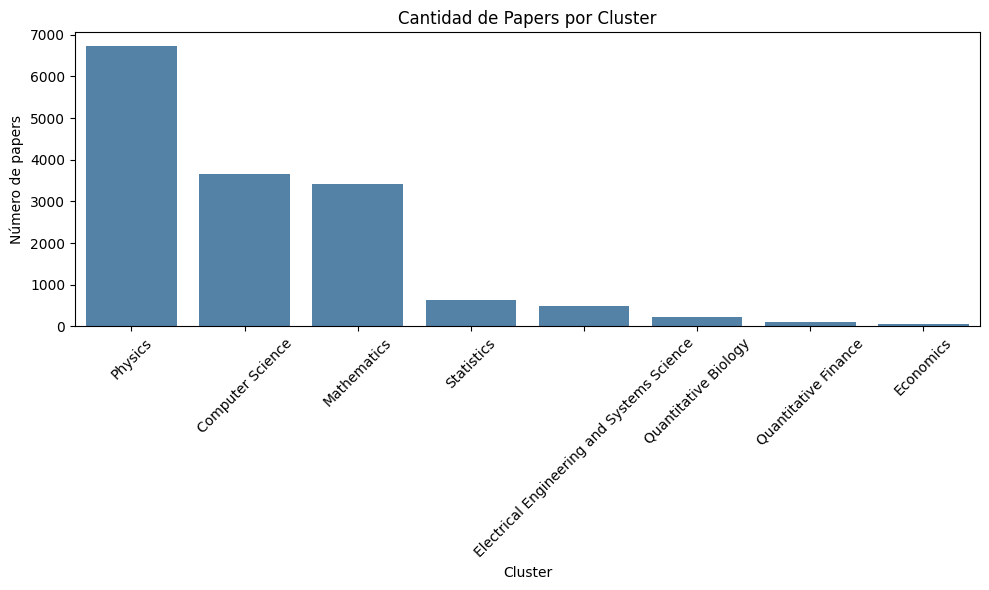

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Creamos una copia de df y separamos las categorías (asumimos que están separadas por espacios)
df_exp = df.copy()
df_exp['categories_list'] = df_exp['categories'].apply(lambda x: x.split())

# Separamos cada categoría en filas (explode)
df_exploded = df_exp.explode('categories_list')

# Renombramos la columna para que coincida con df_arxiv_cat_final
df_exploded = df_exploded.rename(columns={'categories_list': 'Category_abr'})

# Realizamos el merge entre ambos dataframes
df_merged = df_exploded.merge(df_arxiv_cat_final, on='Category_abr', how='left')

# Agrupamos por 'Cluster' y contamos los papers únicos
cluster_counts = df_merged.groupby('Cluster')['id'].nunique().reset_index()
cluster_counts.columns = ['Cluster', 'count']

# Ordenamos de mayor a menor según el número de papers
cluster_counts = cluster_counts.sort_values(by='count', ascending=False)

# Configuramos el tamaño de la figura
plt.figure(figsize=(10,6))

# Graficamos con Seaborn sin asignar colores adicionales
sns.barplot(data=cluster_counts, x='Cluster', y='count', color='steelblue',
            order=cluster_counts['Cluster'])

plt.title("Cantidad de Papers por Cluster")
plt.xlabel("Cluster")
plt.ylabel("Número de papers")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


---

## Categorías

In [ ]:
# Contamos la frecuencia de categorías y mostramos las top 10
cat_counts = df_arxiv_cat['Category'].value_counts().reset_index().head(20)
cat_counts.columns = ['Category', 'count']  # Renombramos columnas

# Mostramos los 10 categorías más frecuentes
print("Top 10 categorías reestructurados:")
print(cat_counts.head(20))

# Frecuencia de categorías y top 10 categorías
fig_cat = px.bar(
    cat_counts,
    x='Category', y='count',
    labels={'Category': 'Categoría', 'count': 'Número de publicaciones'},
    title="Top 20 categorías"
)
fig_cat.show()

Top 10 categorías reestructurados:
                                   Category  count
0                       Systems and Control      2
1                        Information Theory      2
2                        Numerical Analysis      2
3                      Mathematical Physics      2
4                          Machine Learning      2
5                        Biological Physics      1
6                            Atomic Physics      1
7             Atomic and Molecular Clusters      1
8                           Applied Physics      1
9           Atmospheric and Oceanic Physics      1
10                         Chemical Physics      1
11                        Classical Physics      1
12                           Nuclear Theory      1
13                       Nuclear Experiment      1
14                    Computational Physics      1
15  Exactly Solvable and Integrable Systems      1
16           Pattern Formation and Solitons      1
17      Cellular Automata and Lattice Gases    

In [ ]:
cat_counts.head(10)

,Category,count
0,Systems and Control,2
1,Information Theory,2
2,Numerical Analysis,2
3,Mathematical Physics,2
4,Machine Learning,2
5,Biological Physics,1
6,Atomic Physics,1
7,Atomic and Molecular Clusters,1
8,Applied Physics,1
9,Atmospheric and Oceanic Physics,1


In [ ]:
# Identificar posibles duplicados en la columna 'Category' y las abreviaturas asociadas
duplicate_categories = df_arxiv_cat.groupby('Category')['Category_abr'].nunique().reset_index()

# Filtrar solo las categorías que tienen más de una abreviatura asociada
duplicate_categories = duplicate_categories[duplicate_categories['Category_abr'] > 1]

# Mostrar detalles de las categorías repetidas con diferentes abreviaturas
duplicate_details = df_arxiv_cat[df_arxiv_cat['Category'].isin(duplicate_categories['Category'])]

In [ ]:
duplicate_details

,Category_abr,Category,Description
21,cs.IT,Information Theory,Covers theoretical and experimental aspects of...
22,cs.LG,Machine Learning,Papers on all aspects of machine learning rese...
27,cs.NA,Numerical Analysis,cs.NA is an alias for math.NA. Roughly include...
39,cs.SY,Systems and Control,cs.SY is an alias for eess.SY. This section in...
46,eess.SY,Systems and Control,This section includes theoretical and experime...
63,math.IT,Information Theory,math.IT is an alias for cs.IT. Covers theoreti...
67,math.MP,Mathematical Physics,math.MP is an alias for math-ph. Articles in t...
68,math.NA,Numerical Analysis,Numerical algorithms for problems in analysis ...
99,math-ph,Mathematical Physics,Articles in this category focus on areas of re...
152,stat.ML,Machine Learning,"Covers machine learning papers (supervised, un..."


In [39]:
import plotly.express as px

# Lista de categorías duplicadas a excluir
categories_to_exclude = ["Information Theory", "Machine Learning", "Numerical Analysis", "Systems and Control", "Mathematical Physics"]

# Filtrar el DataFrame para no contar las duplicadas
df_filtered = df_arxiv_cat[~df_arxiv_cat['Category'].isin(categories_to_exclude)]

# Contamos la frecuencia de categorías y mostramos las top 20
cat_counts = df_filtered['Category'].value_counts().reset_index().head(20)
cat_counts.columns = ['Category', 'count']  # Renombramos columnas

# Mostramos las 20 categorías más frecuentes sin duplicadas
fig_cat = px.bar(
    cat_counts,
    x='Category', y='count',
    labels={'Category': 'Categoría', 'count': 'Número de publicaciones'},
    title="Top 20 categorías sin duplicadas"
)
fig_cat.show()

# Mostrar los datos filtrados
print("Top 20 categorías sin duplicadas:")
print(cat_counts)


Top 20 categorías sin duplicadas:
                                     Category  count
0                     Artificial Intelligence      1
1                         Accelerator Physics      1
2                            Chaotic Dynamics      1
3         Cellular Automata and Lattice Gases      1
4              Pattern Formation and Solitons      1
5     Exactly Solvable and Integrable Systems      1
6                          Nuclear Experiment      1
7                              Nuclear Theory      1
8             Atmospheric and Oceanic Physics      1
9                High Energy Physics - Theory      1
10                            Applied Physics      1
11              Atomic and Molecular Clusters      1
12                             Atomic Physics      1
13                         Biological Physics      1
14                           Chemical Physics      1
15                          Classical Physics      1
16     Adaptation and Self-Organizing Systems      1
17        Hi

---

## Distribución de Categorías en arXiv

In [ ]:
import plotly.express as px

# Contar las categorías correctamente
cat_counts = df_arxiv_cat['Category'].value_counts().reset_index()
cat_counts.columns = ['Category', 'count']

# Crear el gráfico de treemap
fig_treemap = px.treemap(
    cat_counts,
    path=['Category'],  # Agrupamos por categorías
    values='count',  # Cantidad de publicaciones por categoría
    title="Distribución de Categorías en arXiv",
    labels={'Category': 'Categoría', 'count': 'Número de publicaciones'}
)

fig_treemap.show()


In [119]:
import plotly.express as px

# Contar las categorías correctamente
cat_counts = df_arxiv_cat_final['Category'].value_counts().reset_index()
cat_counts.columns = ['Category', 'count']

# Crear el gráfico de treemap
fig_treemap = px.treemap(
    cat_counts,
    path=['Category'],  # Agrupamos por categorías
    values='count',  # Cantidad de publicaciones por categoría
    title="Distribución de Categorías en arXiv",
    labels={'Category': 'Categoría', 'count': 'Número de publicaciones'}
)

fig_treemap.show()


In [125]:
import plotly.express as px

# Lista de categorías duplicadas a excluir
categories_to_exclude = ["Information Theory", "Machine Learning", "Numerical Analysis", "Systems and Control", "Mathematical Physics"]

# Filtramos el DataFrame para excluir dichas categorías
df_filtered = df_arxiv_cat[~df_arxiv_cat['Category'].isin(categories_to_exclude)]

# Contamos las categorías a partir del DataFrame filtrado
cat_counts_filtered = df_filtered['Category'].value_counts().reset_index()
cat_counts_filtered.columns = ['Category', 'count']

# Creamos el gráfico de treemap sin las categorías duplicadas
fig_treemap = px.treemap(
    cat_counts_filtered,
    path=['Category'],  # Agrupamos por categorías
    values='count',     # Cantidad de publicaciones por categoría
    title="Distribución de Categorías en arXiv (sin duplicados)",
    labels={'Category': 'Categoría', 'count': 'Número de publicaciones'}
)

fig_treemap.show()


In [126]:
import pandas as pd
import plotly.express as px

# Partimos la columna 'categories' en listas (asumiendo que están separadas por espacios)
df_exp = df.copy()
df_exp['categories_list'] = df_exp['categories'].apply(lambda x: x.split())

# Expandimos cada categoría en filas
df_exploded = df_exp.explode('categories_list')

# Renombramos para que coincida con el nombre de columna en df_arxiv_cat_final
df_exploded = df_exploded.rename(columns={'categories_list': 'Category_abr'})

# Realizamos el merge para obtener el nombre completo de la categoría
df_merged = df_exploded.merge(df_arxiv_cat_final, on='Category_abr', how='left')

# Agrupamos por 'Category' y contamos los papers (contando cada paper único por categoría)
cat_counts = df_merged.groupby('Category')['id'].nunique().reset_index()
cat_counts.columns = ['Category', 'count']

# Generamos el treemap con Plotly
fig_treemap = px.treemap(
    cat_counts,
    path=['Category'],
    values='count',
    title="Cantidad de Papers por Categoría",
    labels={'Category': 'Categoría', 'count': 'Número de Papers'}
)
fig_treemap.show()


---

## Wordcloud: Palabras más repetidas 

#### Wordcloud de Category

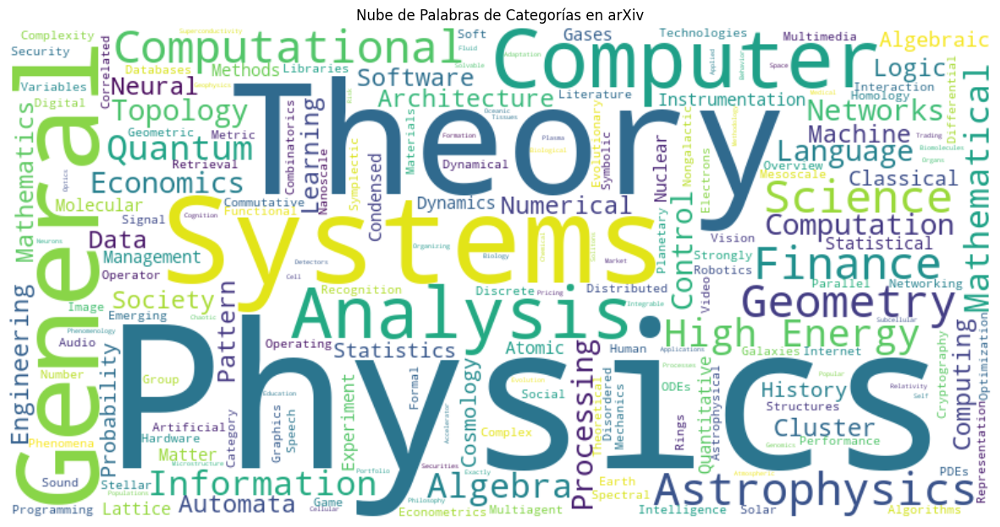

In [127]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Crear el texto a partir de las categorías, repitiéndolas según su frecuencia
text = " ".join(df_arxiv_cat['Category'])

# Generar la nube de palabras
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar el gráfico
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")  # Quitar ejes
plt.title("Nube de Palabras de Categorías en arXiv")
plt.show()


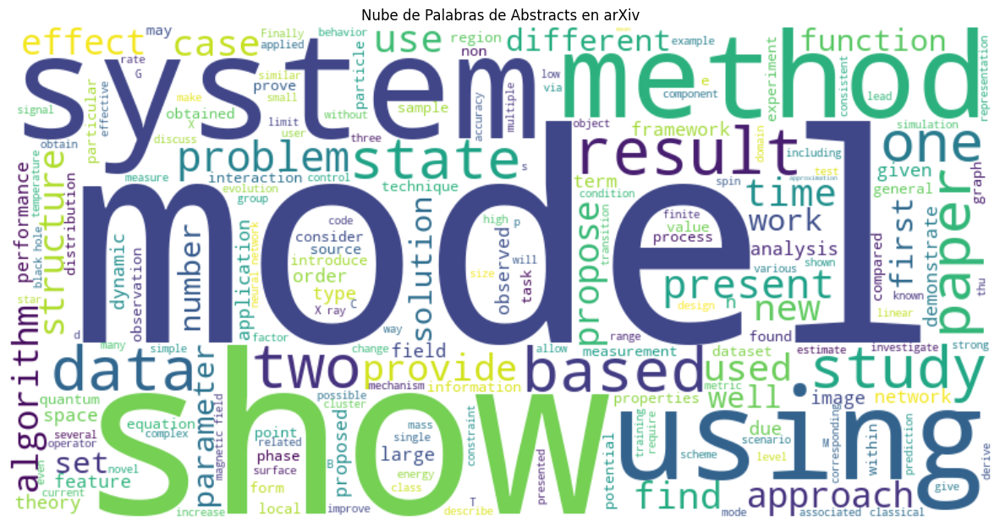

In [128]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Creamos el texto concatenado a partir de los abstracts (omitiendo los valores nulos)
text = " ".join(df['abstract'].dropna().tolist())

# Generamos la nube de palabras
wordcloud = WordCloud(width=800, height=400, background_color='white', max_words=200).generate(text)

# Mostramos el gráfico
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Nube de Palabras de Abstracts en arXiv")
plt.show()


In [136]:
import re
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))

# Limpiamos los abstracts: removemos dígitos, puntuación, stopwords y normalizamos el texto.
def clean_abstract(text):
    text = text.strip().lower()                                 # Eliminamos espacios y pasamos a minúsculas
    text = re.sub(r'\d+', '', text)                             # Eliminamos dígitos
    text = re.sub(r'[^\w\s]', '', text)                         # Eliminamos signos de puntuación
    text = re.sub(r'\s+', ' ', text)                            # Reducimos espacios extra
    tokens = text.split()
    tokens = [word for word in tokens if word not in stop_words] # Eliminamos stopwords
    return " ".join(tokens)

# Creamos la columna 'abstract_clean'
df['abstract_clean'] = df['abstract'].apply(clean_abstract)

In [137]:
from collections import Counter

# Unir todos los abstracts limpios en una sola cadena
text = " ".join(df['abstract_clean'].dropna().tolist())

# Dividir el texto en palabras
words = text.split()

# Contar la frecuencia de cada palabra
word_counts = Counter(words)

# Mostrar las 20 palabras más frecuentes
print(word_counts.most_common(20))


[('model', 6335), ('data', 4930), ('results', 4453), ('using', 4240), ('show', 4234), ('also', 4007), ('models', 3824), ('two', 3816), ('paper', 3451), ('study', 3100), ('method', 3050), ('system', 2950), ('quantum', 2935), ('field', 2849), ('new', 2756), ('time', 2710), ('based', 2674), ('different', 2636), ('one', 2609), ('present', 2568)]


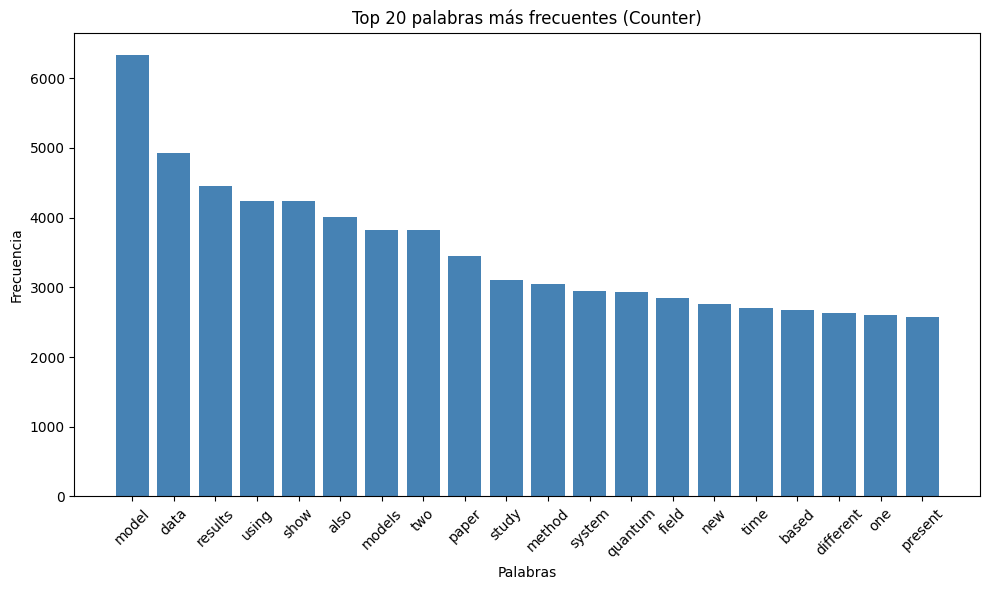

In [140]:
from collections import Counter
import matplotlib.pyplot as plt

# Obtener las 20 palabras más frecuentes
most_common = word_counts.most_common(20)
words_top, counts_top = zip(*most_common)

# Visualizar con un gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(words_top, counts_top, color='steelblue')
plt.xticks(rotation=45)
plt.title("Top 20 palabras más frecuentes (Counter)")
plt.xlabel("Palabras")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()


In [138]:
from sklearn.feature_extraction.text import CountVectorizer

# Inicializar el CountVectorizer (puedes ajustar parámetros, como min_df, stop_words, etc.)
cv = CountVectorizer()

# Ajustar y transformar los abstracts limpios (excluyendo los nulos)
X = cv.fit_transform(df['abstract_clean'].dropna())

# Sumar la frecuencia de cada palabra a lo largo de todos los documentos
sum_words = X.sum(axis=0)

# Crear una lista de tuplas (palabra, frecuencia)
words_freq = [(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]

# Ordenar de mayor a menor frecuencia
words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)

# Mostrar las 20 palabras más frecuentes
print(words_freq[:20])


[('model', 6335), ('data', 4930), ('results', 4453), ('using', 4240), ('show', 4234), ('also', 4007), ('models', 3824), ('two', 3816), ('paper', 3451), ('study', 3100), ('method', 3050), ('system', 2950), ('quantum', 2935), ('field', 2849), ('new', 2756), ('time', 2710), ('based', 2674), ('different', 2636), ('one', 2609), ('present', 2568)]


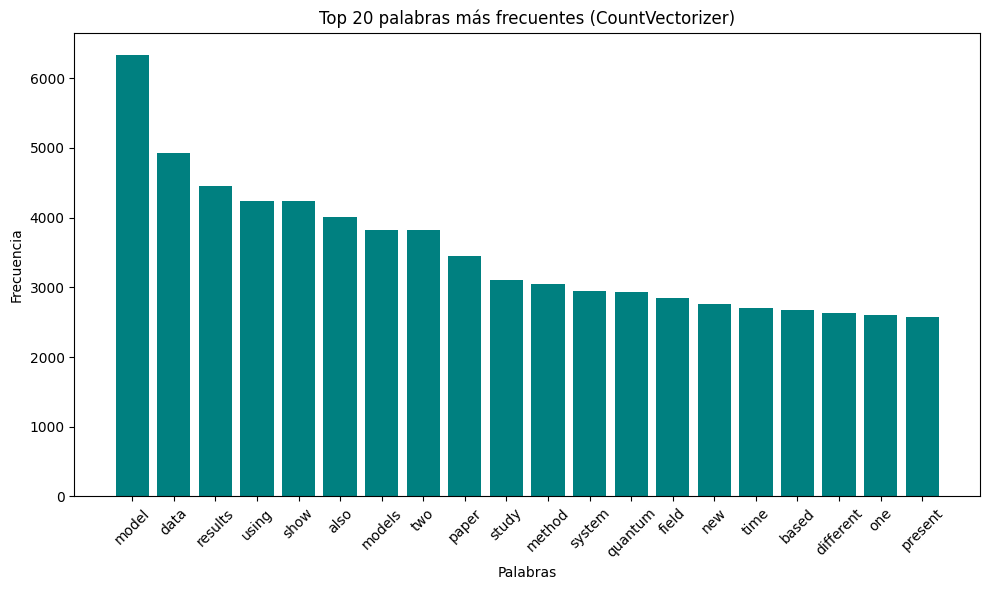

In [141]:
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt

# Inicializamos el CountVectorizer y ajustamos a los abstracts limpios
cv = CountVectorizer()
X = cv.fit_transform(df['abstract_clean'].dropna())

# Sumamos la frecuencia de cada palabra
sum_words = X.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]

# Ordenamos de mayor a menor frecuencia y obtenemos las 20 palabras más frecuentes
words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
words_top2, counts_top2 = zip(*words_freq[:20])

# Visualizar con un gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(words_top2, counts_top2, color='teal')
plt.xticks(rotation=45)
plt.title("Top 20 palabras más frecuentes (CountVectorizer)")
plt.xlabel("Palabras")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()


Information Theory, Machine Learning, Numerical Analysis, Systems and Control, Mathematical Physics	

In [252]:
df_arxiv_cat_clusters.shape

(155, 3)

---

## Remitentes más frecuentes 
Remitente = Autor que manda el artículo científico a arXiv. 
- Aveces hay más de un autor por artículo, pero hay una persona encargada en enviar el trabajo a arXiv. El remitente.

In [248]:
# Contamos la cantidad de veces que cada submitter aparece en el dataset
top_submitters = df['submitter'].value_counts().reset_index().head(10)
top_submitters.columns = ['submitter', 'count']  # Renombramos columnas

# Mostramos los 10 submitters más frecuentes
print("Top 10 submitters:")
print(top_submitters)

# Gráfico de barras con Plotly
fig_submitters = px.bar(
    top_submitters,
    x='submitter', y='count',
    labels={'submitter': 'Submitter', 'count': 'Número de publicaciones'},
    title="Top 10 submitters"
)
fig_submitters.show()

Top 10 submitters:
                 submitter  count
0                    EPTCS     16
1                 Wei Chen      5
2    Grigoris Panotopoulos      4
3             Jarah Evslin      4
4           Juan Maldacena      4
5               Ashoke Sen      4
6               Ivan Losev      4
7  The ATLAS Collaboration      4
8           Bernhard Rumpe      4
9            Paul Townsend      3


---

## Top 3 Categorías por Año

In [143]:
import pandas as pd
import plotly.express as px

# 1. Separar la columna 'categories' en listas y expandir
df_exp = df.copy()
df_exp['categories_list'] = df_exp['categories'].apply(lambda x: x.split())
df_exploded = df_exp.explode('categories_list')

# 2. Renombrar para que coincida con la columna en df_arxiv_cat_final y hacer el merge
df_exploded = df_exploded.rename(columns={'categories_list': 'Category_abr'})
df_merged = df_exploded.merge(df_arxiv_cat_final, on='Category_abr', how='left')

# 3. Agrupar por 'year' y 'Category', y contar los papers únicos (por id)
cat_year_counts = df_merged.groupby(['year', 'Category'])['id'].nunique().reset_index()
cat_year_counts = cat_year_counts.rename(columns={'id': 'count'})

# 4. Para cada año, seleccionar las 3 categorías con mayor cantidad de papers
top3_by_year = cat_year_counts.groupby('year').apply(lambda x: x.nlargest(3, 'count')).reset_index(drop=True)

# 5. Visualización con Plotly: Facet por año
fig = px.bar(
    top3_by_year, 
    x='Category', y='count', 
    color='Category', 
    facet_col='year',
    title="Top 3 Categorías por Año",
    labels={'Category': 'Categoría', 'count': 'Número de Papers', 'year': 'Año'}
)
# Ajustamos las anotaciones para que muestren solo el año
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(showlegend=False, xaxis_tickangle=-45)
fig.show()


/var/folders/3_/bsh490990pv6w7gjtmjv6qy80000gn/T/ipykernel_1397/4086826212.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



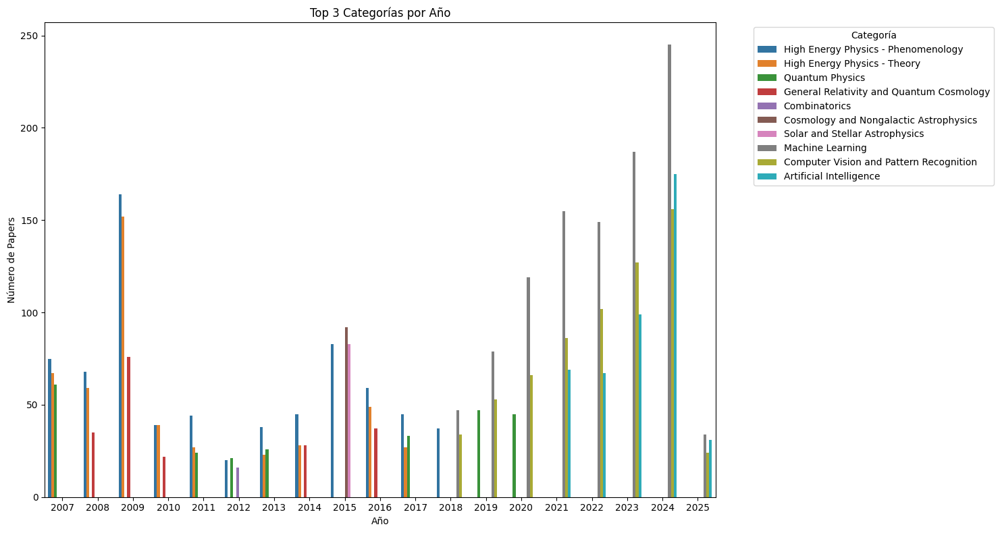

In [145]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# (Usamos el mismo top3_by_year obtenido anteriormente)

plt.figure(figsize=(15,8))
# Usamos un gráfico de barras agrupado, con 'year' en el eje x y barras para cada categoría
sns.barplot(data=top3_by_year, x='year', y='count', hue='Category')
plt.title("Top 3 Categorías por Año")
plt.xlabel("Año")
plt.ylabel("Número de Papers")
plt.legend(title='Categoría', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


---

## Autores más frecuentes (con más publicaciones)


In [80]:
df["authors_parsed"][22]

[['Takeuchi', 'Sachiko', ''], ['Shimizu', 'Kiyotaka', '']]

In [124]:
df["authors"][22]

'Sachiko Takeuchi and Kiyotaka Shimizu'

In [126]:
# Función para formatear la columna de autores:
# Creamos una nueva columna con los nombres y apellidos correctamente formateados
def format_authors(authors):
    formatted_authors = []
    if isinstance(authors, list):
        for a in authors:
            filtered_name = [part for part in a if part.strip()]  # Filtramos valores vacíos
            if len(filtered_name) >= 2:
                formatted_name = " ".join(filtered_name[1:]) + " " + filtered_name[0]  # Reorganizamos
                formatted_authors.append(formatted_name)
    return formatted_authors

# Aplicamos la función a la columna 'authors_parsed'
df['authors_formatted'] = df['authors_parsed'].apply(format_authors)

In [130]:
df['authors_formatted'][0]

['Vanessa Casagrande', 'Yuichi Togashi', 'Alexander S. Mikhailov']

In [ ]:
isinstance(df['authors_parsed'][0], list)

True

In [ ]:
type(df['authors_parsed'][0])

list

In [ ]:
type(df['authors_parsed'])

pandas.core.series.Series

Top 10 autores reestructurados:
           author  count
0        Y. Zhang     14
1        Wei Wang     11
2         Y. Wang     10
3     Dacheng Tao      9
4           Z. Xu      9
5  Kenji Watanabe      9
6         Z. Wang      9
7         J. Wang      9
8       Rui Zhang      9
9          Yu Liu      8


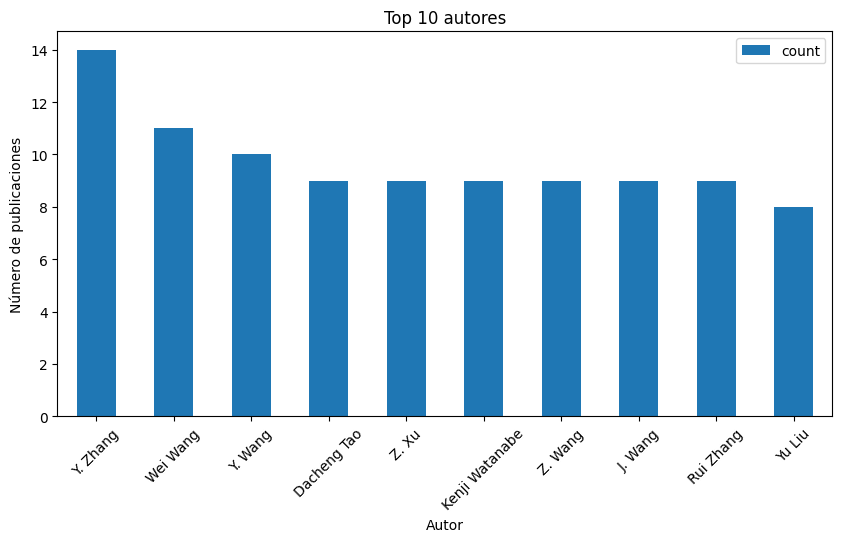

In [129]:
# Lista para almacenar autores reestructurados a partir de la columna formateada
authors_list = []

# Extraemos los autores correctamente formateados desde la nueva columna
for formatted_authors in df['authors_formatted']:
    if isinstance(formatted_authors, list):
        authors_list.extend(formatted_authors)

# Contamos las ocurrencias de cada autor
top_authors = pd.Series(authors_list).value_counts().reset_index()
top_authors.columns = ['author', 'count']

# Mostramos los 10 autores más frecuentes
print("Top 10 autores reestructurados:")
print(top_authors.head(10))

# Mostramos los 10 autores más frecuentes
import matplotlib.pyplot as plt
top_authors.head(10).plot(kind='bar', x='author', y='count', figsize=(10, 5))
plt.title("Top 10 autores")
plt.xlabel("Autor")
plt.ylabel("Número de publicaciones")
plt.xticks(rotation=45)  # Rotamos las etiquetas para mejor visualización
plt.show()

Top 10 autores reestructurados:
           author  count
0        Y. Zhang     14
1        Wei Wang     11
2         Y. Wang     10
3     Dacheng Tao      9
4           Z. Xu      9
5  Kenji Watanabe      9
6         Z. Wang      9
7         J. Wang      9
8       Rui Zhang      9
9          Yu Liu      8


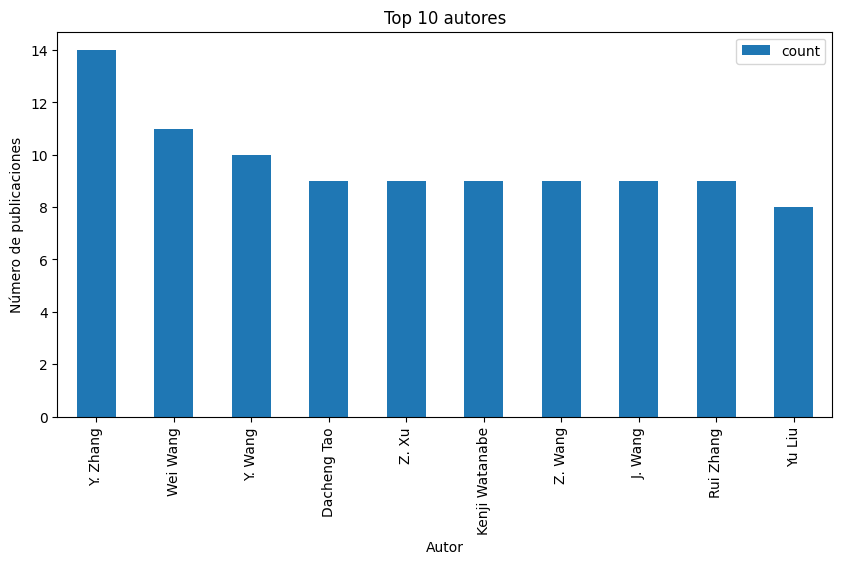

In [86]:
# Lista para almacenar autores reestructurados
authors_list = []

for auth in df['authors_parsed']:
    if isinstance(auth, list):  
        for a in auth:  
            # Filtramos valores vacíos y reorganizamos en "Nombre Inicial Apellido"
            filtered_name = [part for part in a if part.strip()]
            if len(filtered_name) >= 2:
                formatted_name = " ".join(filtered_name[1:]) + " " + filtered_name[0]  # Reorganizamos
                authors_list.append(formatted_name)

# Contamos las ocurrencias de cada autor
top_authors = pd.Series(authors_list).value_counts().reset_index()
top_authors.columns = ['author', 'count']

# Mostramos los 10 autores más frecuentes
print("Top 10 autores reestructurados:")
print(top_authors.head(10))

# Graficamos los resultados con matplotlib
import matplotlib.pyplot as plt
top_authors.head(10).plot(kind='bar', x='author', y='count', figsize=(10, 5))
plt.title("Top 10 autores")
plt.xlabel("Autor")
plt.ylabel("Número de publicaciones")
plt.show()


In [35]:
print(df['authors_parsed'].head(10))  # Ver los primeros 10 valores


0         [[Dent, James B., ], [Kephart, Thomas W., ]]
1            [[Broadbent, Anne, ], [Kashefi, Elham, ]]
2    [[Dyer, Martin, ], [Goldberg, Leslie Ann, ], [...
3                       [[Knutsen, Andreas Leopold, ]]
4               [[Collins, John, ], [Qiu, Jian-Wei, ]]
5                [[Hang, Chao, ], [Huang, Guoxiang, ]]
6                                    [[Novello, M., ]]
7    [[Mazars, Martial, , Laboratoire de Physique T...
8    [[Antonov, A. N., ], [Ivanov, M. V., ], [Barba...
9                               [[Turaev, Vladimir, ]]
Name: authors_parsed, dtype: object


#### Revisamos cuántos autores únicos hay antes de generar el gráfico

In [36]:
# Revisamos cuántos autores únicos hay antes de generar el gráfico
authors_list = []
for auth in df['authors_parsed']:
    if isinstance(auth, list):  # Nos aseguramos de que sean listas
        authors_list.extend(auth)

top_authors = pd.Series(authors_list).value_counts()

print(f"Total de autores únicos: {len(top_authors)}")  # Cantidad de autores únicos
print(top_authors.head(20))  # Ver los 20 autores más frecuentes


Total de autores únicos: 10509
[Liu, Yang, ]               6
[Wang, Wei, ]               5
[Dent, James B., ]          3
[Wen, Xiao-Gang, ]          3
[Li, Liang, ]               3
[Das, Sayan, ]              3
[Yang, Yi, ]                3
[Bekki, Kenji, ]            3
[Chen, Xi, ]                3
[Wang, Jian, ]              3
[Zhang, Wei, ]              3
[Johnson, Clifford V., ]    3
[Takano, Yoshihiko, ]       2
[Garcia, A., ]              2
[Harigaya, Keisuke, ]       2
[Zhang, Hao, ]              2
[Hu, Chen, ]                2
[Wang, Ziming, ]            2
[Zhang, Xiao, ]             2
[Graham, Michael D., ]      2
Name: count, dtype: int64


In [39]:
# Convertir la lista de autores en cadenas de texto
authors_list = []
for auth in df['authors_parsed']:
    if isinstance(auth, list):
        authors_list.extend([", ".join(a).strip() for a in auth])  # Une los nombres correctamente

top_authors = pd.Series(authors_list).value_counts().reset_index()
top_authors.columns = ['author', 'count']

# Si hay menos de 10 autores frecuentes, mostramos todos los disponibles
num_bars = min(10, len(top_authors))

fig_auth = px.bar(
    top_authors.head(num_bars),
    x='author', y='count',
    labels={'author': 'Autor', 'count': 'Número de publicaciones'},
    title=f"Top {num_bars} autores más frecuentes en arXiv"
)

fig_auth.show()


### Analizamos la longitud de los abstracts

Estadísticas de longitud de abstracts:
count    5435.000000
mean      141.403864
std        64.417975
min         5.000000
25%        91.000000
50%       136.000000
75%       186.000000
max       544.000000
Name: abstract_len, dtype: float64


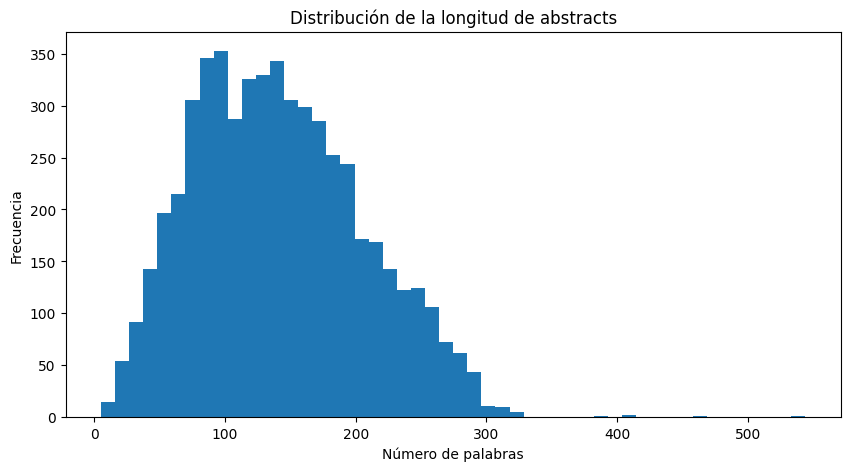

In [12]:
df['abstract_len'] = df['abstract'].apply(lambda x: len(x.split()) if isinstance(x, str) else 0)
print("Estadísticas de longitud de abstracts:")
print(df['abstract_len'].describe())
df['abstract_len'].plot(kind='hist', bins=50, figsize=(10, 5))
plt.title("Distribución de la longitud de abstracts")
plt.xlabel("Número de palabras")
plt.ylabel("Frecuencia")
plt.show()

In [21]:
# Calculamos la longitud de los abstracts
df['abstract_len'] = df['abstract'].apply(lambda x: len(x.split()) if isinstance(x, str) else 0)

# Estadísticas y distribución de la longitud de abstracts
print("Estadísticas de longitud de abstracts:")
print(df['abstract_len'].describe())

fig_abs_hist = px.histogram(
    df, x='abstract_len',
    nbins=50,
    title="Distribución de la longitud de abstracts",
    labels={'abstract_len': 'Número de palabras'}
)
fig_abs_hist.show()

Estadísticas de longitud de abstracts:
count    5435.000000
mean      141.403864
std        64.417975
min         5.000000
25%        91.000000
50%       136.000000
75%       186.000000
max       544.000000
Name: abstract_len, dtype: float64


In [31]:
# Estadísticas y distribución de la longitud de abstracts
df['abstract_len'] = df['abstract'].apply(lambda x: len(x.split()) if isinstance(x, str) else 0)
fig_abs_hist = px.histogram(
    df, x='abstract_len',
    nbins=50,
    color_discrete_sequence=['indianred'],
    title="Distribución de la longitud de abstracts",
    labels={'abstract_len': 'Número de palabras'}
)
fig_abs_hist.show()

In [22]:
# Boxplot de la longitud de abstracts
fig_abs_box = px.box(
    df, y='abstract_len',
    title="Boxplot de la longitud de abstracts",
    labels={'abstract_len': 'Número de palabras'}
)
fig_abs_box.show()

In [32]:
# Boxplot de la longitud de abstracts
fig_abs_box = px.box(
    df, y='abstract_len',
    color_discrete_sequence=['darkcyan'],
    title="Boxplot de la longitud de abstracts",
    labels={'abstract_len': 'Número de palabras'}
)
fig_abs_box.show()

In [26]:
# Calculamos el número de autores por paper
df['num_authors'] = df['authors_parsed'].apply(len)

# Histograma del número de autores por paper
fig_authors_hist = px.histogram(
    df, x='num_authors',
    nbins=200,
    title="Distribución del número de autores por paper",
    labels={'num_authors': 'Número de autores'}
)
fig_authors_hist.show()

In [34]:
# Número de autores por paper
df['num_authors'] = df['authors_parsed'].apply(len)
fig_authors_hist = px.histogram(
    df, x='num_authors',
    nbins=100,
    color='num_authors',  # Usamos el número de autores para asignar color
    labels={'num_authors': 'Número de autores'},
    title="Distribución del número de autores por paper"
)
fig_authors_hist.show()

In [27]:
# Relación entre número de autores y longitud de abstract
fig_scatter = px.scatter(
    df, x='num_authors', y='abstract_len',
    title="Relación entre número de autores y longitud de abstract",
    labels={'num_authors': 'Número de autores', 'abstract_len': 'Número de palabras en el abstract'},
    trendline="ols"
)
fig_scatter.show()

In [35]:
# Creamos una nueva variable: densidad del abstract (número de palabras por autor)
df['abstract_density'] = df['abstract_len'] / df['num_authors']

# Relación entre número de autores y longitud de abstract
fig_scatter = px.scatter(
    df, x='num_authors', y='abstract_len',
    color='year',             # Color según el año de actualización
    size='abstract_density',  # Tamaño según la densidad del abstract
    labels={
        'num_authors': 'Número de autores',
        'abstract_len': 'Número de palabras en el abstract',
        'year': 'Año de actualización'
    },
    title="Relación entre número de autores y longitud de abstract"
)
fig_scatter.show()

In [36]:
# MATRIZ DE DISPERSIÓN: abstract_len, num_authors y abstract_density
fig_matrix = px.scatter_matrix(
    df,
    dimensions=['abstract_len', 'num_authors', 'abstract_density'],
    color='year',  # Color por año de actualización
    title="Matriz de dispersión: abstract_len, num_authors y abstract_density"
)
fig_matrix.show()

In [37]:
# VIOLIN PLOT: Distribución de la longitud de abstracts por año
fig_violin = px.violin(
    df,
    x='year',
    y='abstract_len',
    box=True,      # Mostramos el boxplot dentro del violín
    points='all',  # Mostramos todos los puntos
    title="Distribución de la longitud de abstracts por año"
)
fig_violin.show()

In [39]:
# TREEMAP: Visualización jerárquica de categorías
fig_treemap = px.treemap(
    cat_counts,
    path=['categories'],
    values='count',
    title="Treemap de categorías"
)
fig_treemap.show()

In [40]:
# LINE CHART: Publicaciones por mes
df['month_year'] = df['update_date'].dt.to_period('M').astype(str)
monthly_counts = df['month_year'].value_counts().reset_index()
monthly_counts.columns = ['month_year', 'count']
monthly_counts = monthly_counts.sort_values(by='month_year')
fig_line = px.line(
    monthly_counts,
    x='month_year', y='count',
    title="Publicaciones por mes",
    labels={'month_year': 'Mes-Año', 'count': 'Número de publicaciones'}
)
fig_line.update_layout(xaxis_tickangle=-45)
fig_line.show()

In [41]:
# HISTOGRAMA: Distribución de la longitud de comentarios
df['comments_len'] = df['comments'].apply(lambda x: len(x.split()) if isinstance(x, str) else 0)
fig_comments_hist = px.histogram(
    df, x='comments_len',
    nbins=50,
    title="Distribución de la longitud de comentarios",
    labels={'comments_len': 'Número de palabras en comentarios'},
    color='comments_len',  # Asignamos un gradiente de color según la longitud
)
fig_comments_hist.show()

In [42]:
# SCATTERPLOT: Relación entre número de autores y longitud de abstract
# Se asigna el color según el año y el tamaño de las burbujas según la densidad del abstract
fig_scatter = px.scatter(
    df, x='num_authors', y='abstract_len',
    color='year',
    size='abstract_density',
    title="Relación entre número de autores y longitud de abstract",
    labels={
        'num_authors': 'Número de autores',
        'abstract_len': 'Número de palabras en el abstract',
        'year': 'Año de actualización'
    }
)
fig_scatter.show()

In [57]:
# Creamos una nueva columna con los nombres y apellidos correctamente formateados
def format_authors(authors):
    formatted_authors = []
    if isinstance(authors, list):
        for a in authors:
            filtered_name = [part for part in a if part.strip()]  # Filtramos valores vacíos
            if len(filtered_name) >= 2:
                formatted_name = " ".join(filtered_name[1:]) + " " + filtered_name[0]  # Reorganizamos
                formatted_authors.append(formatted_name)
    return formatted_authors

# Aplicamos la función a la columna 'authors_parsed'
df['authors_formatted'] = df['authors_parsed'].apply(format_authors)

---

---

---

---

---

---

---

---

---

In [ ]:
df.head(5)

,id,submitter,authors,title,comments,journal-ref,doi,report-no,categories,license,abstract,versions,update_date,authors_parsed,authors_formatted
0,0704.0021,Yuichi Togashi,"Vanessa Casagrande, Yuichi Togashi, Alexander ...",Molecular Synchronization Waves in Arrays of A...,"5 pages, 4 figures","Phys. Rev. Lett. 99, 048301 (2007)",10.1103/PhysRevLett.99.048301,None,nlin.PS physics.chem-ph q-bio.MN,None,Spatiotemporal pattern formation in a produc...,"[{'version': 'v1', 'created': 'Sat, 31 Mar 200...",2007-07-24,"[[Casagrande, Vanessa, ], [Togashi, Yuichi, ],...","[Vanessa Casagrande, Yuichi Togashi, Alexander..."
1,0704.0094,HongSheng Zhao,"HongSheng Zhao (SUPA, St Andrews)",Timing and Lensing of the Colliding Bullet Clu...,"5-pages, Physical Review D, rapid publication ...",None,None,None,astro-ph,None,We present semi-analytical constraint on the...,"[{'version': 'v1', 'created': 'Mon, 2 Apr 2007...",2007-05-23,"[[Zhao, HongSheng, , SUPA, St Andrews]]","[HongSheng SUPA, St Andrews Zhao]"
2,0704.0757,Ou Yong-Cheng,Yong-Cheng Ou and Heng Fan,Bounds on Negativity of Superpositions,5 pages,"Physical Review A 76,022320(2007)",10.1103/PhysRevA.76.022320,None,quant-ph,None,The entanglement quantified by negativity of...,"[{'version': 'v1', 'created': 'Thu, 5 Apr 2007...",2007-09-06,"[[Ou, Yong-Cheng, ], [Fan, Heng, ]]","[Yong-Cheng Ou, Heng Fan]"
3,0704.0775,Efton Park,Efton Park and Jody Trout,K_0-theory of n-potents in rings and algebras,To appear in the European Journal of Mathematics,None,None,None,math.KT math.RA,http://arxiv.org/licenses/nonexclusive-distrib...,Let $n \geq 2$ be an integer. An \emph{$n$-p...,"[{'version': 'v1', 'created': 'Thu, 5 Apr 2007...",2018-09-10,"[[Park, Efton, ], [Trout, Jody, ]]","[Efton Park, Jody Trout]"
4,0704.0818,Michael Shay,"M. A. Shay, J. F. Drake, and M. Swisdak",Two-scale structure of the electron dissipatio...,"Submitted to Physical Review Letters, 4 pages,...",None,10.1103/PhysRevLett.99.155002,None,physics.plasm-ph physics.space-ph,None,Particle in cell (PIC) simulations of collis...,"[{'version': 'v1', 'created': 'Fri, 6 Apr 2007...",2009-11-13,"[[Shay, M. A., ], [Drake, J. F., ], [Swisdak, ...","[M. A. Shay, J. F. Drake, M. Swisdak]"


In [ ]:
df.head(5).T

,0,1,2,3,4
id,0704.0021,0704.0094,0704.0757,0704.0775,0704.0818
submitter,Yuichi Togashi,HongSheng Zhao,Ou Yong-Cheng,Efton Park,Michael Shay
authors,"Vanessa Casagrande, Yuichi Togashi, Alexander ...","HongSheng Zhao (SUPA, St Andrews)",Yong-Cheng Ou and Heng Fan,Efton Park and Jody Trout,"M. A. Shay, J. F. Drake, and M. Swisdak"
title,Molecular Synchronization Waves in Arrays of A...,Timing and Lensing of the Colliding Bullet Clu...,Bounds on Negativity of Superpositions,K_0-theory of n-potents in rings and algebras,Two-scale structure of the electron dissipatio...
comments,"5 pages, 4 figures","5-pages, Physical Review D, rapid publication ...",5 pages,To appear in the European Journal of Mathematics,"Submitted to Physical Review Letters, 4 pages,..."
journal-ref,"Phys. Rev. Lett. 99, 048301 (2007)",None,"Physical Review A 76,022320(2007)",None,None
doi,10.1103/PhysRevLett.99.048301,None,10.1103/PhysRevA.76.022320,None,10.1103/PhysRevLett.99.155002
report-no,None,None,None,None,None
categories,nlin.PS physics.chem-ph q-bio.MN,astro-ph,quant-ph,math.KT math.RA,physics.plasm-ph physics.space-ph
license,None,None,None,http://arxiv.org/licenses/nonexclusive-distrib...,None


In [ ]:
df.shape

(13196, 15)

In [286]:
df.columns

Index(['id', 'submitter', 'authors', 'title', 'comments', 'journal-ref', 'doi',
       'report-no', 'categories', 'license', 'abstract', 'versions',
       'update_date', 'authors_parsed', 'authors_formatted'],
      dtype='object')

In [283]:
df["abstract"][0]

'  Spatiotemporal pattern formation in a product-activated enzymic reaction at\nhigh enzyme concentrations is investigated. Stochastic simulations show that\ncatalytic turnover cycles of individual enzymes can become coherent and that\ncomplex wave patterns of molecular synchronization can develop. The analysis\nbased on the mean-field approximation indicates that the observed patterns\nresult from the presence of Hopf and wave bifurcations in the considered\nsystem.\n'

In [282]:
print(df["abstract"][0])

  Spatiotemporal pattern formation in a product-activated enzymic reaction at
high enzyme concentrations is investigated. Stochastic simulations show that
catalytic turnover cycles of individual enzymes can become coherent and that
complex wave patterns of molecular synchronization can develop. The analysis
based on the mean-field approximation indicates that the observed patterns
result from the presence of Hopf and wave bifurcations in the considered
system.



In [284]:
df["abstract"][1]

'  We present semi-analytical constraint on the amount of dark matter in the\nmerging bullet galaxy cluster using the classical Local Group timing arguments.\nWe consider particle orbits in potential models which fit the lensing data.\n{\\it Marginally consistent} CDM models in Newtonian gravity are found with a\ntotal mass M_{CDM} = 1 x 10^{15}Msun of Cold DM: the bullet subhalo can move\nwith V_{DM}=3000km/s, and the "bullet" X-ray gas can move with\nV_{gas}=4200km/s. These are nearly the {\\it maximum speeds} that are\naccelerable by the gravity of two truncated CDM halos in a Hubble time even\nwithout the ram pressure. Consistency breaks down if one adopts higher end of\nthe error bars for the bullet gas speed (5000-5400km/s), and the bullet gas\nwould not be bound by the sub-cluster halo for the Hubble time. Models with\nV_{DM}~ 4500km/s ~ V_{gas} would invoke unrealistic large amount M_{CDM}=7x\n10^{15}Msun of CDM for a cluster containing only ~ 10^{14}Msun of gas. Our\nresults a

In [280]:
print(df["abstract"][1])

  We present semi-analytical constraint on the amount of dark matter in the
merging bullet galaxy cluster using the classical Local Group timing arguments.
We consider particle orbits in potential models which fit the lensing data.
{\it Marginally consistent} CDM models in Newtonian gravity are found with a
total mass M_{CDM} = 1 x 10^{15}Msun of Cold DM: the bullet subhalo can move
with V_{DM}=3000km/s, and the "bullet" X-ray gas can move with
V_{gas}=4200km/s. These are nearly the {\it maximum speeds} that are
accelerable by the gravity of two truncated CDM halos in a Hubble time even
without the ram pressure. Consistency breaks down if one adopts higher end of
the error bars for the bullet gas speed (5000-5400km/s), and the bullet gas
would not be bound by the sub-cluster halo for the Hubble time. Models with
V_{DM}~ 4500km/s ~ V_{gas} would invoke unrealistic large amount M_{CDM}=7x
10^{15}Msun of CDM for a cluster containing only ~ 10^{14}Msun of gas. Our
results are generalisable

In [285]:
df["abstract"][5]

'  In this paper we study Hardy and Rellich type inequalities for\nBaouendi-Grushin vector fields : $\\nabla_{\\gamma}=(\\nabla_x,\n|x|^{2\\gamma}\\nabla_y)$ where $\\gamma>0$, $\\nabla_x$ and $\\nabla_y$ are usual\ngradient operators in the variables $x\\in \\mathbb{R}^m$ and $y\\in\\mathbb{R}^k$,\nrespectively. In the first part of the paper, we prove some weighted Hardy type\ninequalities with remainder terms. In the second part, we prove two versions of\nweighted Rellich type inequality on the whole space. We find sharp constants\nfor these inequalities. We also obtain their improved versions for bounded\ndomains.\n'

In [281]:
print(df["abstract"][5])

  In this paper we study Hardy and Rellich type inequalities for
Baouendi-Grushin vector fields : $\nabla_{\gamma}=(\nabla_x,
|x|^{2\gamma}\nabla_y)$ where $\gamma>0$, $\nabla_x$ and $\nabla_y$ are usual
gradient operators in the variables $x\in \mathbb{R}^m$ and $y\in\mathbb{R}^k$,
respectively. In the first part of the paper, we prove some weighted Hardy type
inequalities with remainder terms. In the second part, we prove two versions of
weighted Rellich type inequality on the whole space. We find sharp constants
for these inequalities. We also obtain their improved versions for bounded
domains.



In [ ]:
df_arxiv_cat_final.columns 

Index(['Cluster', 'Category_abr', 'Category', 'Description'], dtype='object')

In [288]:
df_arxiv_cat_final["Cluster"].value_counts()

Cluster
Physics                                       51
Computer Science                              40
Mathematics                                   32
Quantitative Biology                          10
Quantitative Finance                           9
Statistics                                     6
Electrical Engineering and Systems Science     4
Economics                                      3
Name: count, dtype: int64

In [289]:
df_arxiv_cat_final["Category"].value_counts()

Category
Systems and Control      2
Information Theory       2
Numerical Analysis       2
Mathematical Physics     2
Machine Learning         2
                        ..
Category Theory          1
Complex Variables        1
Differential Geometry    1
Dynamical Systems        1
Other Statistics         1
Name: count, Length: 149, dtype: int64

In [291]:
df_arxiv_cat_final["Category_abr"].value_counts()

Category_abr
cs.AI      1
nucl-th    1
math-ph    1
nlin.AO    1
nlin.CD    1
          ..
math.CO    1
math.CT    1
math.CV    1
math.DG    1
stat.TH    1
Name: count, Length: 155, dtype: int64

---

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# # Limpiamos los abstracts: removemos dígitos, puntuación, stopwords y normalizamos el texto.
# def clean_abstract(text):
#     text = text.strip().lower()                                 # Eliminamos espacios y pasamos a minúsculas
#     text = re.sub(r'\d+', '', text)                             # Eliminamos dígitos
#     text = re.sub(r'[^\w\s]', '', text)                         # Eliminamos signos de puntuación
#     text = re.sub(r'\s+', ' ', text)                            # Reducimos espacios extra
#     tokens = text.split()
#     tokens = [word for word in tokens if word not in stop_words] # Eliminamos stopwords
#     return " ".join(tokens)

# # Creamos la columna 'abstract_clean'
# df['abstract_clean'] = df['abstract'].apply(clean_abstract)

# Mapeamos cada categoría (abreviación) al cluster correspondiente.
# Asumimos que df_arxiv_cat_final tiene las columnas 'Category_abr' y 'Cluster'
cat_to_cluster = dict(zip(df_arxiv_cat_final['Category_abr'], df_arxiv_cat_final['Cluster']))

def map_to_cluster(cat_str):
    # Separamos la cadena de categorías (suponiendo que están separadas por espacios)
    cat_list = cat_str.split()
    # Mapeamos cada categoría a su cluster, si existe en nuestro diccionario
    clusters = [cat_to_cluster[cat] for cat in cat_list if cat in cat_to_cluster]
    if clusters:
        # Si hay más de un cluster, elegimos el que se repite con mayor frecuencia
        from collections import Counter
        most_common = Counter(clusters).most_common(1)[0][0]
        return most_common
    else:
        return None

# Creamos la columna 'cluster' aplicando el mapeo
df['cluster'] = df['categories'].apply(map_to_cluster)

# Creamos un mapa de características a partir de los abstracts limpios usando CountVectorizer
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=1000)  # Puedes ajustar max_features u otros parámetros
X_counts = vectorizer.fit_transform(df['abstract_clean'])
print("Shape de la matriz de features:", X_counts.shape)

# ----------------------
# MODELO DE CLASIFICACIÓN CON TENSORFLOW
# ----------------------
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.preprocessing import LabelEncoder

# Filtramos las filas que tienen cluster asignado
df_model = df.dropna(subset=['cluster']).copy()

# Asumimos que el orden de df_model coincide con X_counts; 
# si no, habría que reindexar o filtrar X_counts acorde al subset.
mask = df_model.index  
X = X_counts[mask]

# Codificamos los clusters en etiquetas numéricas
le = LabelEncoder()
y = le.fit_transform(df_model['cluster'])

# Creamos un modelo secuencial simple
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X.shape[1],)))
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(len(le.classes_), activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

# Entrenamos el modelo (ajusta epochs y batch_size según convenga)
history = model.fit(X.toarray(), y, epochs=10, batch_size=32, validation_split=0.2)

# ----------------------
# MODELO WORD2VEC (OPCIONAL)
# ----------------------
from gensim.models import Word2Vec

# Tokenizamos los abstracts limpios para Word2Vec
df['abstract_tokens'] = df['abstract_clean'].apply(lambda x: x.split())

# Entrenamos el modelo Word2Vec
w2v_model = Word2Vec(sentences=df['abstract_tokens'], vector_size=100, window=5, min_count=2, workers=4)

# Ejemplo de obtención del vector de una palabra
print("Vector para 'model':", w2v_model.wv['model'])


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/egoitzaulestiapadilla/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Shape de la matriz de features: (13196, 1000)


2025-02-18 00:06:32.190028: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │       128,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 8)              │           520 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 136,904 (534.78 KB)

 Trainable params: 136,904 (534.78 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
318/318 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6774 - loss: 0.9924 - val_accuracy: 0.8699 - val_loss: 0.4088
Epoch 2/10
318/318 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8732 - loss: 0.4164 - val_accuracy: 0.8738 - val_loss: 0.4015
Epoch 3/10
318/318 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8993 - loss: 0.3030 - val_accuracy: 0.8660 - val_loss: 0.4307
Epoch 4/10
318/318 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9344 - loss: 0.2062 - val_accuracy: 0.8801 - val_loss: 0.4146
Epoch 5/10
318/318 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9579 - loss: 0.1411 - val_accuracy: 0.8691 - val_loss: 0.5264
Epoch 6/10
318/318 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9736 - loss: 0.0910 - val_accuracy: 0.8793 - val_loss: 0.5664
Epoch 7/10
318/318 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9802 - loss: 0.0635 - val_accuracy: 0.8671 - val_loss: 0.6417
Epoch 8/10
318/318 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9849 - loss: 0.0525 - val_accuracy: 0.

In [321]:
# Seleccionamos una sub-matriz: primeras 10 filas y 10 columnas
sub_matrix = X_counts[:100, :100].toarray()

# Obtenemos los nombres de las palabras (características) de nuestro vectorizador
feature_names = vectorizer.get_feature_names_out()[:100]

# Creamos un DataFrame para visualizar en modo tabla
df_sub = pd.DataFrame(sub_matrix, columns=feature_names)
print(df_sub)

    ability  able  absorption  account  accretion  accuracy  accurate  \
0         0     0           0        0          0         0         0   
1         0     0           0        0          0         0         0   
2         0     0           0        0          0         0         0   
3         0     0           0        0          0         0         0   
4         0     0           0        0          0         0         0   
..      ...   ...         ...      ...        ...       ...       ...   
95        0     0           0        0          0         0         0   
96        0     0           0        0          0         0         1   
97        0     0           0        0          0         0         0   
98        0     0           0        0          0         0         0   
99        0     0           0        0          0         0         0   

    achieve  achieved  achieves  ...  black  bound  boundary  bounded  bounds  \
0         0         0         0  ...      

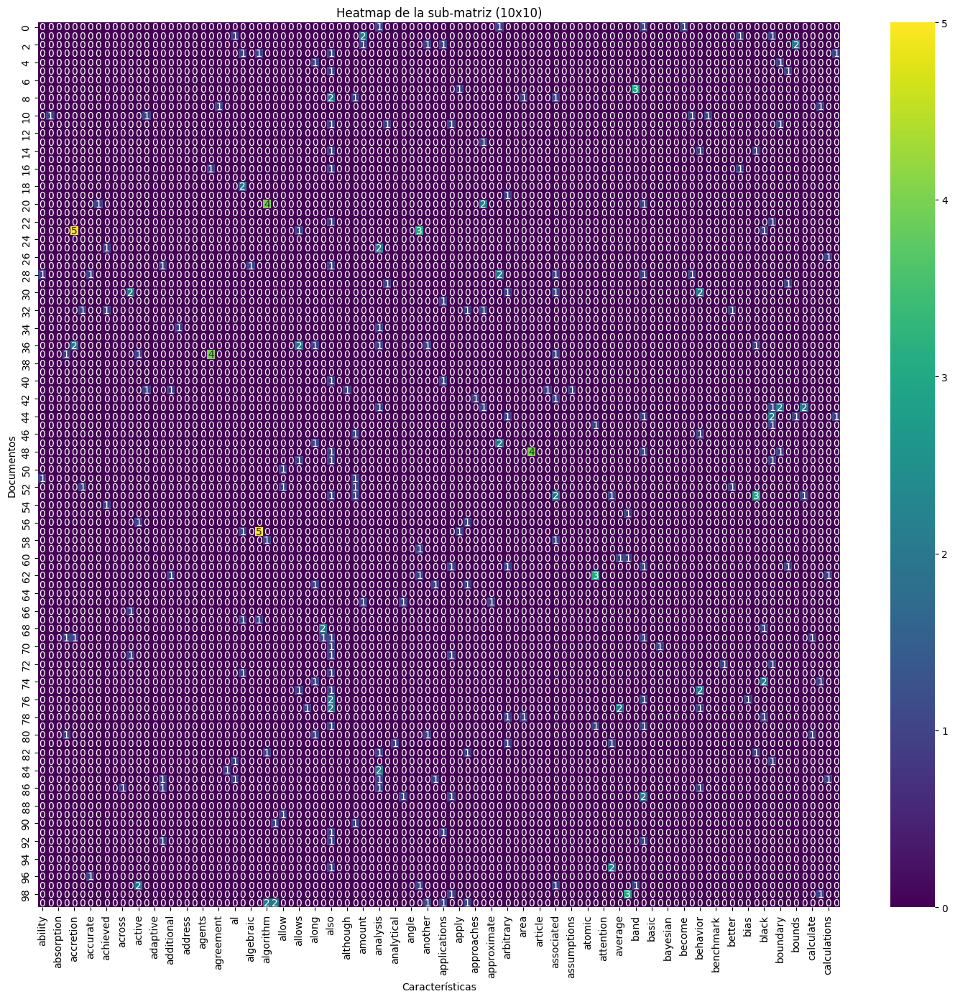

In [324]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(18,16))
sns.heatmap(df_sub, annot=True, cmap='viridis')
plt.title("Heatmap de la sub-matriz (10x10)")
plt.xlabel("Características")
plt.ylabel("Documentos")
plt.show()


In [ ]:
import plotly.express as px

fig = px.imshow(df_sub, text_auto=True, aspect="auto", 
                title="Heatmap de la sub-matriz (10x10)",
                labels={'x': 'Características', 'y': 'Documentos'})
fig.show()


In [ ]:
# Seleccionamos una sub-matriz: primeras 10 filas y 10 columnas
sub_matrix = X_counts[:1000, :1000].toarray()

# Obtenemos los nombres de las palabras (características) de nuestro vectorizador
feature_names = vectorizer.get_feature_names_out()[:1000]

# Creamos un DataFrame para visualizar en modo tabla
df_sub = pd.DataFrame(sub_matrix, columns=feature_names)
print(df_sub)

     ability  able  absorption  account  accretion  accuracy  accurate  \
0          0     0           0        0          0         0         0   
1          0     0           0        0          0         0         0   
2          0     0           0        0          0         0         0   
3          0     0           0        0          0         0         0   
4          0     0           0        0          0         0         0   
..       ...   ...         ...      ...        ...       ...       ...   
995        0     0           0        0          0         0         0   
996        0     0           0        0          0         0         0   
997        0     0           0        0          0         0         0   
998        0     0           0        0          0         0         0   
999        0     0           0        0          0         0         0   

     achieve  achieved  achieves  ...  within  without  work  works  would  \
0          0         0         0 

In [326]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(180,160))
sns.heatmap(df_sub, annot=True, cmap='viridis')
plt.title("Heatmap de la sub-matriz (10x10)")
plt.xlabel("Características")
plt.ylabel("Documentos")
plt.show()

In [318]:
type(X_counts)

scipy.sparse._csr.csr_matrix

In [305]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import plotly.graph_objects as go

# Convertimos la matriz de features a densa (ya que X_counts es una sparse matrix)
X_dense = X.toarray()

# Dividimos los datos en train y test (80/20), asegurando estratificación por y
X_train, X_test, y_train, y_test = train_test_split(
    X_dense, y, test_size=0.2, random_state=42, stratify=y
)

# Creamos el modelo secuencial
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(len(le.classes_), activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

# Entrenamos el modelo usando el 20% del conjunto de train para validación
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Obtenemos predicciones para train y test
y_pred_train = np.argmax(model.predict(X_train), axis=1)
y_pred_test = np.argmax(model.predict(X_test), axis=1)

# Calculamos la matriz de confusión para train y test
cm_train = confusion_matrix(y_train, y_pred_train)
cm_test = confusion_matrix(y_test, y_pred_test)

# Función para plotear la matriz de confusión con Plotly
def plot_confusion_matrix(cm, title):
    fig = go.Figure(data=go.Heatmap(
        z=cm,
        x=le.classes_,
        y=le.classes_,
        colorscale='Blues',
        text=cm,
        texttemplate="%{text}"
    ))
    fig.update_layout(
        title=title,
        xaxis_title="Predicción",
        yaxis_title="Valor verdadero"
    )
    fig.show()

# Visualizamos las matrices de confusión
plot_confusion_matrix(cm_train, "Matriz de Confusión - Train")
plot_confusion_matrix(cm_test, "Matriz de Confusión - Test")

# Mostramos el reporte de clasificación para train y test
print("Reporte de clasificación - Train:")
print(classification_report(y_train, y_pred_train, target_names=le.classes_))

print("Reporte de clasificación - Test:")
print(classification_report(y_test, y_pred_test, target_names=le.classes_))


/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 128)            │       128,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 8)              │           520 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 136,904 (534.78 KB)

 Trainable params: 136,904 (534.78 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
255/255 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6846 - loss: 1.0106 - val_accuracy: 0.8663 - val_loss: 0.4805
Epoch 2/10
255/255 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8757 - loss: 0.4115 - val_accuracy: 0.8688 - val_loss: 0.4708
Epoch 3/10
255/255 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9105 - loss: 0.2817 - val_accuracy: 0.8658 - val_loss: 0.4909
Epoch 4/10
255/255 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9369 - loss: 0.1988 - val_accuracy: 0.8609 - val_loss: 0.5499
Epoch 5/10
255/255 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9644 - loss: 0.1223 - val_accuracy: 0.8545 - val_loss: 0.6260
Epoch 6/10
255/255 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9749 - loss: 0.0884 - val_accuracy: 0.8624 - val_loss: 0.6817
Epoch 7/10
255/255 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9843 - loss: 0.0572 - val_accuracy: 0.8560 - val_loss: 0.7625
Epoch 8/10
255/255 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9899 - loss: 0.0402 - val_accuracy: 0.

Reporte de clasificación - Train:
                                            precision    recall  f1-score   support

                          Computer Science       0.96      0.97      0.96      2380
                                 Economics       0.96      0.77      0.86        35
Electrical Engineering and Systems Science       0.87      0.88      0.88       182
                               Mathematics       0.96      0.97      0.96      2075
                                   Physics       0.98      0.99      0.98      5101
                      Quantitative Biology       0.90      0.83      0.86       117
                      Quantitative Finance       0.91      0.89      0.90        47
                                Statistics       0.95      0.90      0.92       235

                                  accuracy                           0.97     10172
                                 macro avg       0.94      0.90      0.92     10172
                              weighted a

## ! Aún por implantar

In [ ]:
from sklearn.utils import class_weight
import numpy as np

# Calculamos los pesos de las clases en el conjunto de entrenamiento
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = dict(enumerate(class_weights))
print("Class weights:", class_weights_dict)

# Entrenamos el modelo incluyendo class_weight
history = model.fit(
    X_train, y_train,
    epochs=10,
    batch_size=32,
    validation_split=0.2,
    class_weight=class_weights_dict
)


# Modelo Word2Vec

- Interpretación: Los vectores representan la "esencia" semántica de las palabras; la cercanía entre vectores (por ejemplo, usando similitud coseno) refleja similitud en el contexto o significado.

- Visualización: Con reducción de dimensionalidad (TSNE en este caso) podemos ver gráficamente cómo se relacionan las palabras en el espacio aprendido.

In [309]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import plotly.express as px

# Seleccionamos un subconjunto de palabras del vocabulario, por ejemplo, las 100 más frecuentes
words = w2v_model.wv.index_to_key[:100]
vectors = np.array([w2v_model.wv[word] for word in words])

# Aplicamos TSNE para reducir a 2 dimensiones
tsne = TSNE(n_components=2, random_state=42)
vectors_2d = tsne.fit_transform(vectors)

# Creamos un DataFrame para visualizar
df_tsne = pd.DataFrame(vectors_2d, columns=['x', 'y'])
df_tsne['word'] = words

# Graficamos con Plotly
fig_tsne = px.scatter(
    df_tsne, x='x', y='y', text='word',
    title="Visualización TSNE de Word2Vec (100 palabras más frecuentes)",
    labels={'x': 'Componente 1', 'y': 'Componente 2'}
)
fig_tsne.update_traces(textposition='top center')
fig_tsne.show()


In [312]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import plotly.express as px

# Seleccionamos un subconjunto de palabras del vocabulario, por ejemplo, las 100 más frecuentes
words = w2v_model.wv.index_to_key[:100]
vectors = np.array([w2v_model.wv[word] for word in words])

# Aplicamos TSNE para reducir a 3 dimensiones
tsne = TSNE(n_components=3, random_state=42)
vectors_3d = tsne.fit_transform(vectors)

# Creamos un DataFrame para la visualización
df_tsne3d = pd.DataFrame(vectors_3d, columns=['x', 'y', 'z'])
df_tsne3d['word'] = words

# Graficamos con Plotly en 3D
fig_tsne3d = px.scatter_3d(
    df_tsne3d,
    x='x', y='y', z='z',
    text='word',
    title="Visualización TSNE 3D de Word2Vec (100 palabras más frecuentes)"
)
fig_tsne3d.update_traces(marker=dict(size=5), selector=dict(mode='markers+text'))
fig_tsne3d.show()


In [315]:
# Graficamos con Plotly en 3D
fig_tsne3d = px.scatter_3d(
    df_tsne3d,
    x='x', y='y', z='z',
    text='word',
    title="Visualización TSNE 3D de Word2Vec (100 palabras más frecuentes)"
)
fig_tsne3d.update_traces(marker=dict(size=5), selector=dict(mode='markers+text'))
fig_tsne3d.show()

In [316]:
fig_tsne3d.update_layout(
    width=1200,              # Ancho del gráfico
    height=1000,             # Alto del gráfico
    margin=dict(l=0, r=0, t=50, b=0),
    scene=dict(
        aspectmode='cube'    # Forzamos que la escena sea un cubo
    )
)
fig_tsne3d.show()